# Q1)
Implement full-batch and stochastic gradient descent. Find the average number of steps it takes to converge to an $\epsilon$-neighborhood of the minimizer for both datasets. Visualize the convergence process for 15 epochs. Choose $\epsilon = 0.001$ for convergence criteria. Which dataset and optimizer takes a larger number of epochs to converge, and why? Show the contour plots for different epochs (or show an animation/GIF) for visualisation of optimisation process. Also, make a plot for Loss v/s epochs.

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1 import make_axes_locatable

import torch
# from sklearn.tree import DecisionTreeClassifier,plot_tree
# from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
import seaborn as sns
plt.style.use('ggplot')
# Retina mode
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

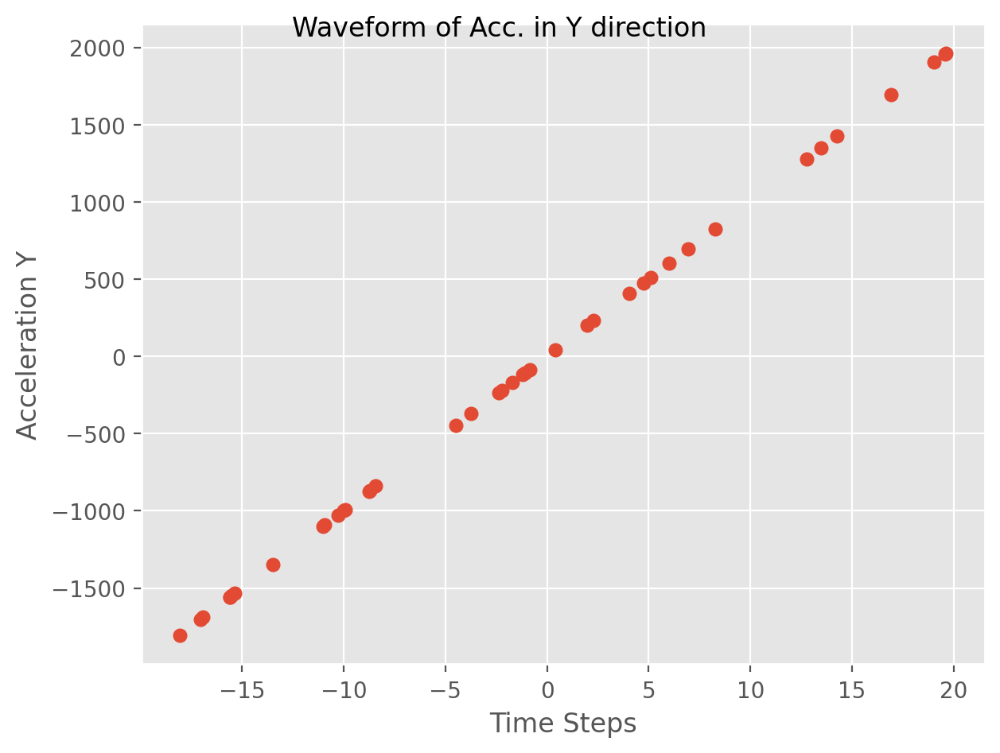

In [26]:
num_samples = 40
np.random.seed(45) 
    
# Generate data
x1 = np.random.uniform(-20, 20, num_samples)
x1_new=np.hstack((np.ones((x1.reshape(-1,1).shape[0],1)), x1.reshape(-1,1)))
f_x1 = 100*x1 + 1
eps = np.random.randn(num_samples)
y = f_x1 + eps

plt.scatter(x1, f_x1)
plt.xlabel('Time Steps')
plt.ylabel('Acceleration Y')
# plt.xlim(0,10)
plt.tight_layout(h_pad=2)
plt.suptitle("Waveform of Acc. in Y direction")
# plt.savefig("Acc_Y_subplot",dpi=300)
# plt.legend()
plt.show()

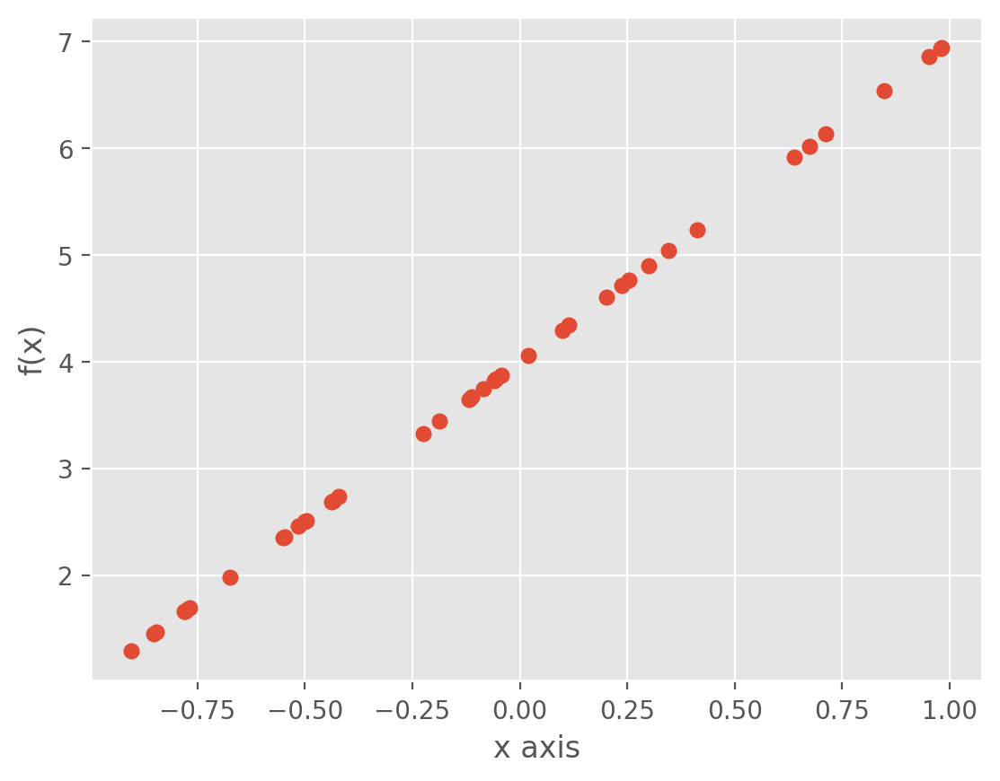

In [27]:
np.random.seed(45)
num_samples = 40
    
# Generate data
x2 = np.random.uniform(-1, 1, num_samples)
x2_new=np.hstack((np.ones((x2.reshape(-1,1).shape[0],1)), x2.reshape(-1,1)))
f_x2 = 3*x2 + 4
eps = np.random.randn(num_samples)
y = f_x2 + eps

plt.scatter(x2, f_x2)
plt.xlabel("x axis")
plt.ylabel("f(x)")
# plt.legend()
plt.show()

In [28]:
# Define the loss function
def loss_function(theta, X, y):
    if(X.ndim==1):
        X=X.reshape(-1,1)
        X= np.hstack((np.ones((X.shape[0],1)), X))
    return np.mean((np.dot(X, theta) - y)**2)

def loss_brute(theta0,theta1,X,y):
    loss=0
    for i in range(len(y)):
        loss+=(y[i]-theta0-(theta1*X[i][1]))**2
    return loss/len(y)
print(loss_function([1,102],x1,f_x1))

505.3481206113539


In [29]:
def full_batch_gradient_descent(X, y,initial_theta=-1, learning_rate=0.01, epsilon=0.001, max_epochs=500):
    # Initialize parameters randomly
    if(initial_theta==-1):
        theta = np.random.randn(X.shape[1])
    else:
        theta = initial_theta
    if(X.ndim==1):
        X= np.hstack((np.ones((X.shape[0],1)), X))
    learning_rate=0.01
    # theta = np.array([20.,60.])
    count_epochs=0
    loss_history = [loss_function(theta,X,y)]
    prevloss=loss_history[0].copy()
    theta_history = [theta.copy()]
    print(prevloss)
    for _ in range(max_epochs):
        gradient = np.dot(X.T, (np.dot(X, theta) - y)) / len(y)
        # print(gradient)
        theta -= learning_rate * gradient
        loss = loss_function(theta,X,y)
        loss_history.append(loss.copy())
        theta_history.append(theta.copy())
        count_epochs+=1
        if prevloss-loss < epsilon:
            break
        prevloss=loss.copy()
        print(prevloss)
    return theta, loss_history,theta_history,count_epochs

# a,b,c,d=full_batch_gradient_descent(x1_new,f_x1,initial_theta=[3,150])
# print(a)
# print(loss_function(a,x1_new,f_x1))


In [30]:
# Define the stochastic gradient descent algorithm
def stochastic_gradient_descent(X, y,initial_theta=-1, learning_rate=0.01, epsilon=0.001, max_epochs=100):
    if(initial_theta==-1):
        theta = np.random.randn(len(y))
    else: 
        theta=initial_theta
    if(X.ndim==1):
        X=X.reshape(-1,1)
        X= np.hstack((np.ones((X.shape[0],1)), X))
    # theta=np.array([100.,100.])
    epochLoss=0
    count_epochs=0
    loss_history = [loss_function(theta,X,y)]
    theta_history = [theta.copy()]
    prevloss= loss_history[0].copy()
    for _ in range(max_epochs):
        for i in range(len(y)):
            gradient = np.dot(X[i].T, (np.dot(X[i], theta) - y[i]))
            theta -= learning_rate * gradient
        loss = np.mean((np.dot(X, theta) - y) ** 2) / 2
        loss_history.append(loss.copy())
        theta_history.append(theta.copy())
        count_epochs+=1
        if abs(prevloss-loss) < epsilon:
            break
        prevloss=loss.copy()
    return theta, loss_history,theta_history,count_epochs
a,b,c,d=stochastic_gradient_descent(x1_new,f_x1,initial_theta=[3,150])
print(a)
print(loss_function(a,x1_new,f_x1))
# a=stochastic_gradient_descent(x1_new,f_x1)


[ 0.97893342 99.99975264]
0.00043387816057043565


In [31]:
# Visualization functions
def plot_convergence(loss_history, title):
    plt.plot(loss_history)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.show()

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1 import make_axes_locatable

def plot_surface_and_contour(X, y,range0=[-100,100],range1=[-20,120], scatter_pts=None):
    # Define the range of values for theta0 and theta1
    theta0_values = np.linspace(range0[0],range0[1], 1000)
    theta1_values = np.linspace(range1[0],range1[1], 1000)

    # Create a meshgrid for theta0 and theta1 values
    theta0_grid, theta1_grid = np.meshgrid(theta0_values, theta1_values)

    # Compute the loss function for each combination of theta0 and theta1
    loss_values = np.zeros_like(theta0_grid)
    for i in range(len(theta0_values)):
        for j in range(len(theta1_values)):
            theta = np.array([theta0_values[i], theta1_values[j]])
            loss_values[i, j] = loss_function(theta, X, y)

    # Create the figure and subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    # Plot the surface on the first subplot
    ax1 = fig.add_subplot(121, projection='3d')
    ax1.plot_surface(theta0_grid, theta1_grid, loss_values, cmap='magma')
    ax1.view_init(elev=30, azim=45)  # Change the angles as needed
    if scatter_pts is not None:
        ax1.scatter(scatter_pts[0], scatter_pts[1], loss_function([scatter_pts[0], scatter_pts[1]], X, y), s=100, c='black')
    ax1.set_xlabel('Theta0')
    ax1.set_ylabel('Theta1')
    ax1.set_zlabel('Loss')
    ax1.set_title('Surface Plot of Loss Function')
    
    # Plot the contour plot on the second subplot
    contour=ax2.contourf(theta0_values, theta1_values, loss_values, cmap='magma', levels=20)
    if scatter_pts is not None:
        ax2.scatter(scatter_pts[0], scatter_pts[1], c='white')
    ax2.set_xlabel('Theta0')
    ax2.set_ylabel('Theta1')
    ax2.set_title('Contour Plot of Loss Function')

    # Add colorbar for the contour plot
    divider = make_axes_locatable(ax2)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    cbar = plt.colorbar(contour, cax=cax)
    
    # Adjust layout and show plot
    plt.tight_layout(pad=3.0, w_pad=2.0)
    plt.show()

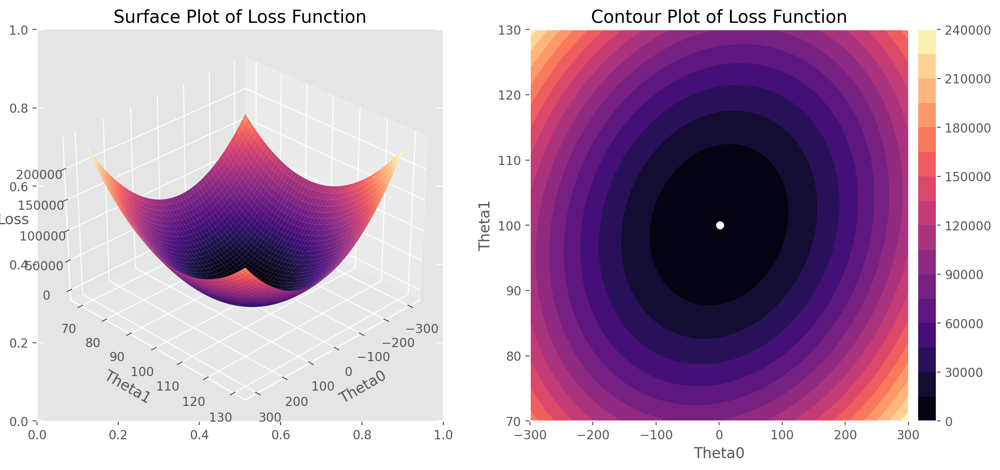

In [43]:
# Range 
# Surface Plot of f_x1 = 100x+1
plot_surface_and_contour(x1_new, f_x1,range0=[-300,300],range1=[70,130],scatter_pts=[1,100])

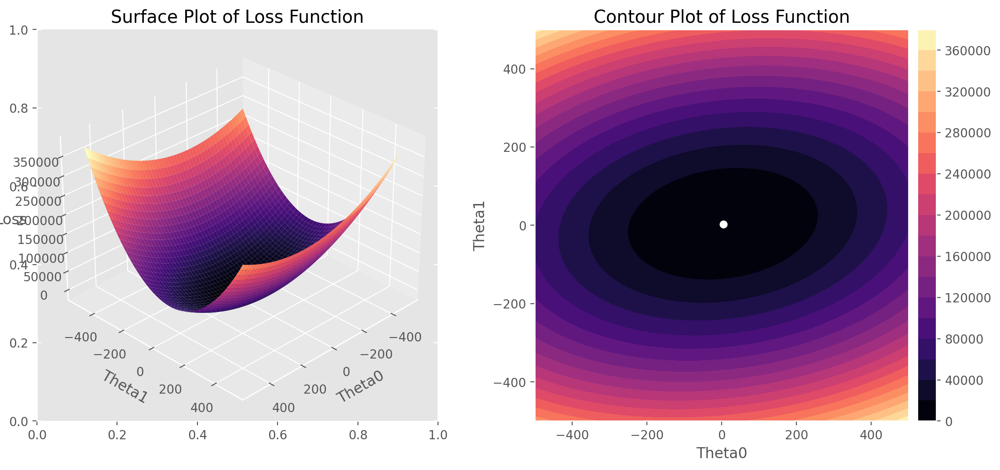

In [44]:
#  Surface plot of f_x2= 3x + 4
plot_surface_and_contour(x2_new,f_x2,range0=[-500,500],range1=[-500,500],scatter_pts=[4,3])

In [33]:
def create_contour(X, y,range0=[-100,100],range1=[-20,120],minima=None, scatter_pts1=None,scatter_pts2=None):
    # Define the range of values for theta0 and theta1
    theta0_values = np.linspace(range0[0],range0[1], 1000)
    theta1_values = np.linspace(range1[0],range1[1], 1000)

    # Create a meshgrid for theta0 and theta1 values
    theta0_grid, theta1_grid = np.meshgrid(theta0_values, theta1_values)

    # Compute the loss function for each combination of theta0 and theta1
    loss_values = np.zeros_like(theta0_grid)
    for i in range(len(theta0_values)):
        for j in range(len(theta1_values)):
            theta = np.array([theta0_values[i], theta1_values[j]])
            loss_values[i, j] = loss_function(theta, X, y)

    # Plot the contour plot
    fig, ax = plt.subplots()
    contour = ax.contourf(theta0_values, theta1_values, loss_values, levels=20, cmap='magma')
    if scatter_pts1 is not None:
        ax.scatter(minima[0], minima[1], c='white')  # Reversed scatter_pts[0] and scatter_pts[1] for correct positioning
        ax.scatter(scatter_pts1[0], scatter_pts1[1], c='red')  # Reversed scatter_pts[0] and scatter_pts[1] for correct positioning
        # Draw vertical and horizontal lines
        ax.axvline(scatter_pts1[0], color='red', linestyle='--')
        ax.axhline(scatter_pts1[1], color='red', linestyle='--')
    if scatter_pts2 is not None:
        ax.scatter(scatter_pts2[0], scatter_pts2[1], c='green')  # Reversed scatter_pts[0] and scatter_pts[1] for correct positioning
        # Draw vertical and horizontal lines
        ax.axvline(scatter_pts2[0], color='lightgreen', linestyle='--')
        ax.axhline(scatter_pts2[1], color='lightgreen', linestyle='--')
        
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    cbar = plt.colorbar(contour, cax=cax)
    cbar.set_label('Loss')
    ax.set_xlabel('Theta0')
    ax.set_ylabel('Theta1')
    ax.set_title('Contour Plot of Loss Function')
    plt.show()

# print(loss_function([10,100],x1_new,f_x1))
# create_contour(x1_new, f_x1, [1,100])

In [10]:
print(loss_function([-1,101],x1_new,f_x1))

137.11226441770012


In [34]:
# Dataset 1
alpha=0.01
epsilon=0.001
initial_theta=[100,125]
max_epochs=1000
# Full Batch
theta_fullGD1,loss_fullGD1,theta_history_fullGD1,num_epochs_fullGD1=full_batch_gradient_descent(x1_new,f_x1,initial_theta=initial_theta,learning_rate=alpha,epsilon=epsilon,max_epochs=max_epochs)

# SGD
theta_SGD1,loss_SGD1,theta_history_SGD1,num_epochs_SGD1=stochastic_gradient_descent(x1_new,f_x1,initial_theta=initial_theta,learning_rate=alpha,epsilon=epsilon,max_epochs=max_epochs)
while(len(loss_SGD1)<=max_epochs):
    loss_SGD1.append(loss_SGD1[-1])
    theta_history_SGD1.append(theta_history_SGD1[-1])

80377.29144275739
14368.041435685893
9610.617984582615
9112.569740372302
8913.739098994838
8738.893080569014
8568.845148217759
8402.201236497709
8238.80476554159
8078.5863028154945
7921.4836098380765
7767.436064521998
7616.384251900306
7468.269914397808
7323.035927499203
7180.62627758797
7040.986040334077
6904.061359510308
6769.799426220945
6638.148458534565
6509.057681512869
6382.477307627846
6258.358517559854
6136.65344136899
6017.31514003276
5900.297587342666
5785.555652152876
5673.04508097418
5562.72248090631
5454.545302902249
5348.471825358002
5244.461138021472
5142.473126214224
5042.468455360152
4944.408555814977
4848.255607990759
4753.972527769694
4661.522952201584
4570.871225479424
4481.982385187727
4394.8221488182635
4309.356900548054
4225.553678274475
4143.380160902476
4062.8046558789965
3983.796086969919
3906.3239822745563
3830.358462473324
3755.8702293039423
3682.830554261696
3611.2112675195285
3540.9847470634654
3472.1239080394953
3404.602192307426
3338.393558198067
3273.4

In [12]:
print(f"The value of theta0 and theta1 are respectively {theta_fullGD1[0]} and {theta_fullGD1[1]}")
print(num_epochs_fullGD1)
print(loss_fullGD1)

The value of theta0 and theta1 are respectively 1.2254730138497947 and 100.00304649312172
620
[80377.29144275739, 14368.041435685893, 9610.617984582615, 9112.569740372302, 8913.739098994838, 8738.893080569014, 8568.845148217759, 8402.201236497709, 8238.80476554159, 8078.5863028154945, 7921.4836098380765, 7767.436064521998, 7616.384251900306, 7468.269914397808, 7323.035927499203, 7180.62627758797, 7040.986040334077, 6904.061359510308, 6769.799426220945, 6638.148458534565, 6509.057681512869, 6382.477307627846, 6258.358517559854, 6136.65344136899, 6017.31514003276, 5900.297587342666, 5785.555652152876, 5673.04508097418, 5562.72248090631, 5454.545302902249, 5348.471825358002, 5244.461138021472, 5142.473126214224, 5042.468455360152, 4944.408555814977, 4848.255607990759, 4753.972527769694, 4661.522952201584, 4570.871225479424, 4481.982385187727, 4394.8221488182635, 4309.356900548054, 4225.553678274475, 4143.380160902476, 4062.8046558789965, 3983.796086969919, 3906.3239822745563, 3830.3584624

In [13]:
print(f"The value of theta0 and theta1 are respectively {theta_SGD1[0]} and {theta_SGD1[1]}")
print(num_epochs_SGD1)

The value of theta0 and theta1 are respectively 1.0135624163639743 and 100.00015924933295
13


# Loss V/s Epochs 

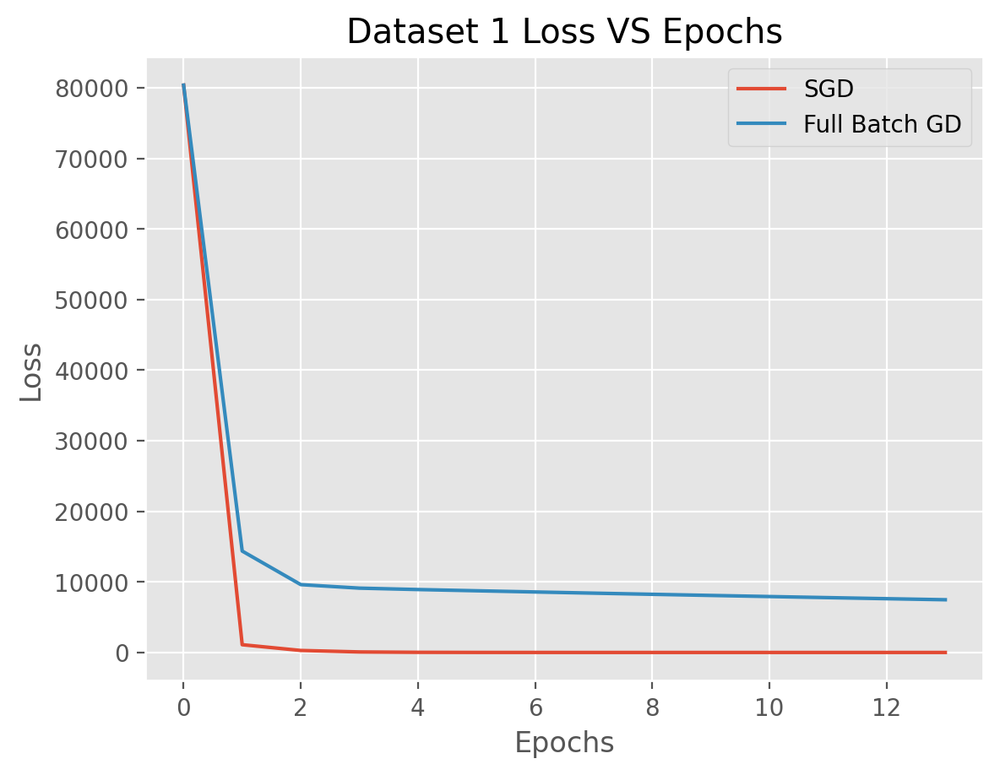

In [51]:

plt.plot(loss_SGD1[0:14],label='SGD')
plt.plot(loss_fullGD1[0:14],label='Full Batch GD')
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Loss")
# plt.yscale("log")
plt.title("Dataset 1 Loss VS Epochs")
plt.show()

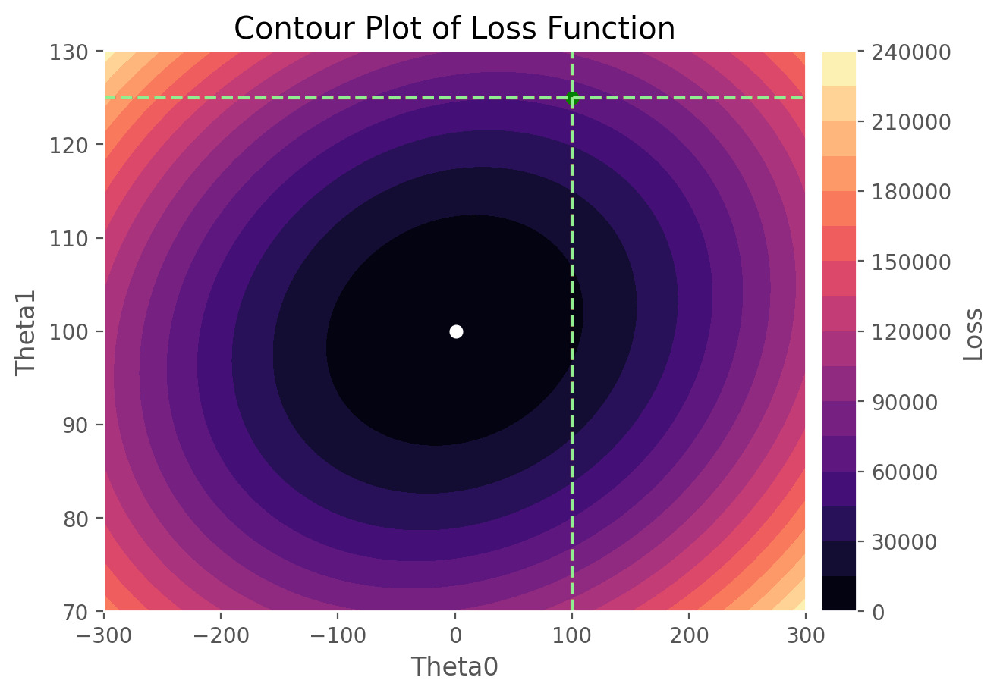

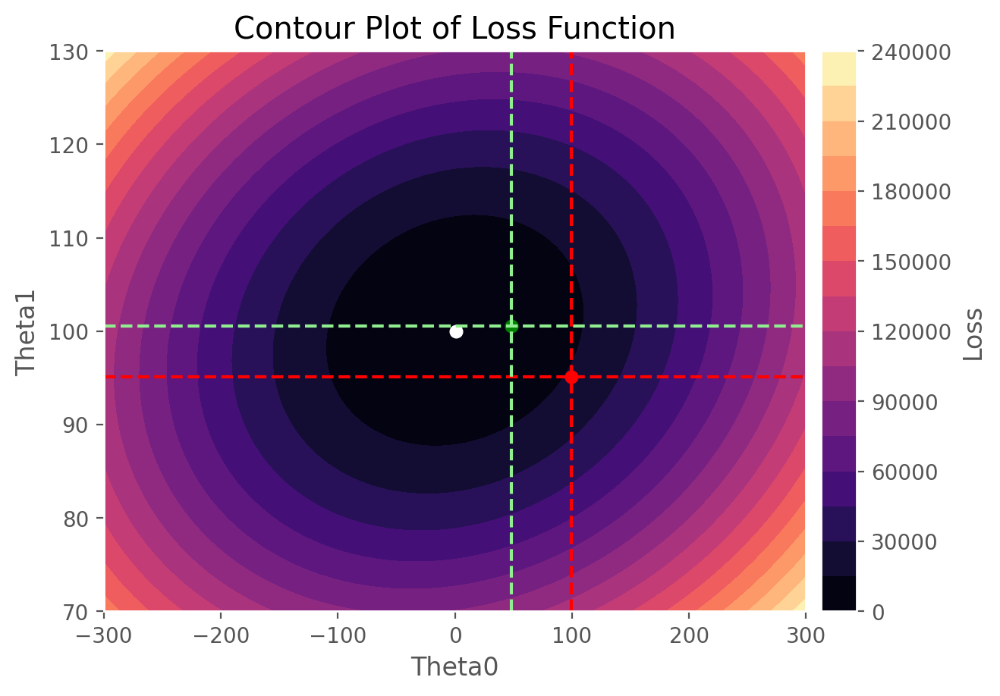

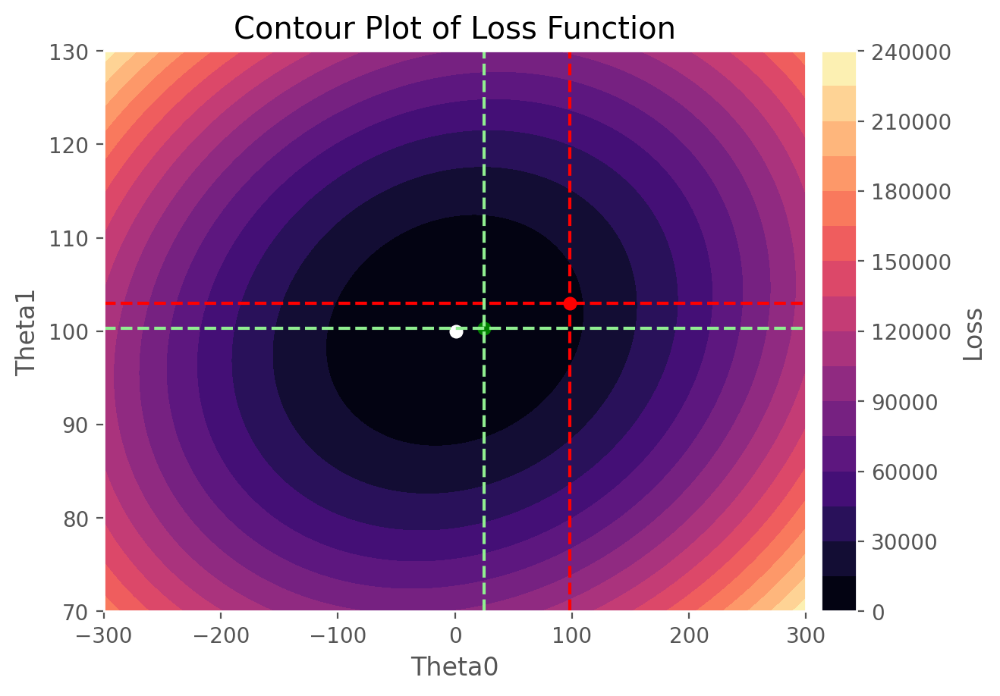

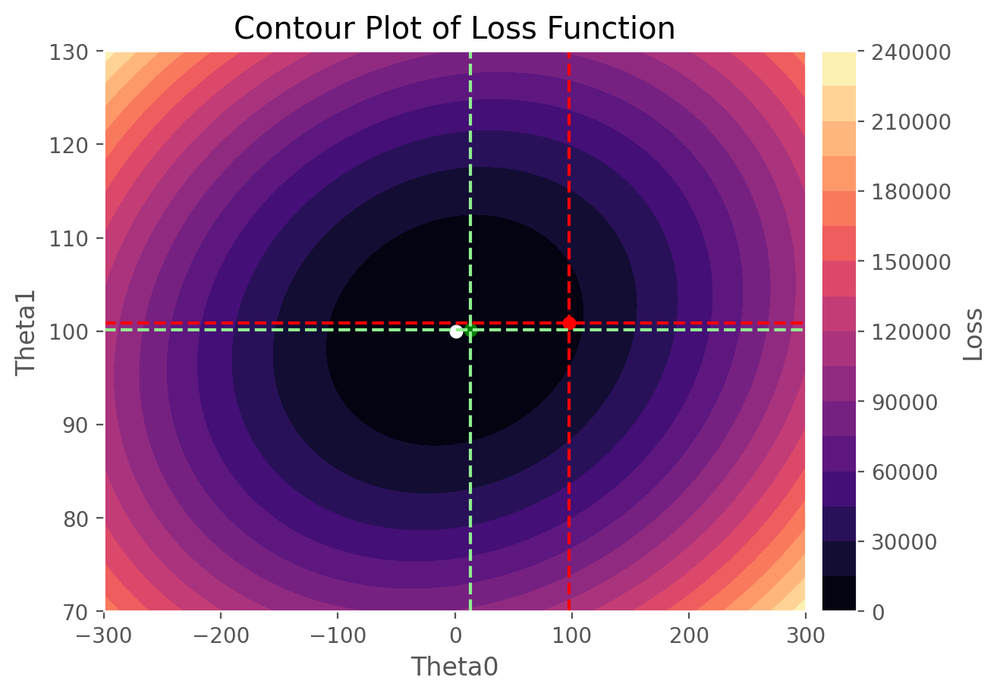

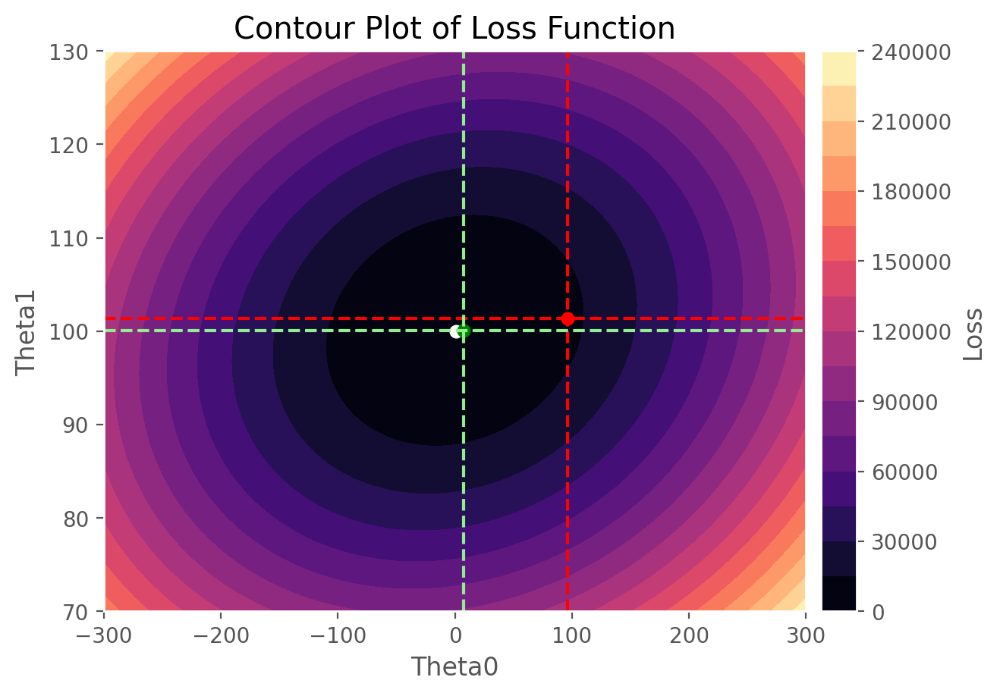

...

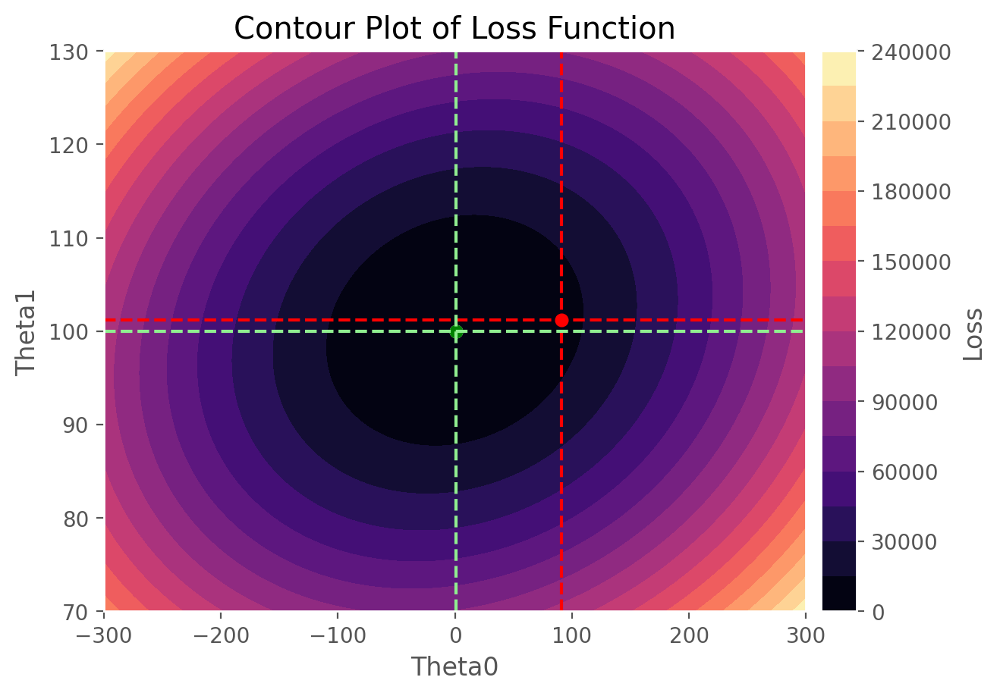

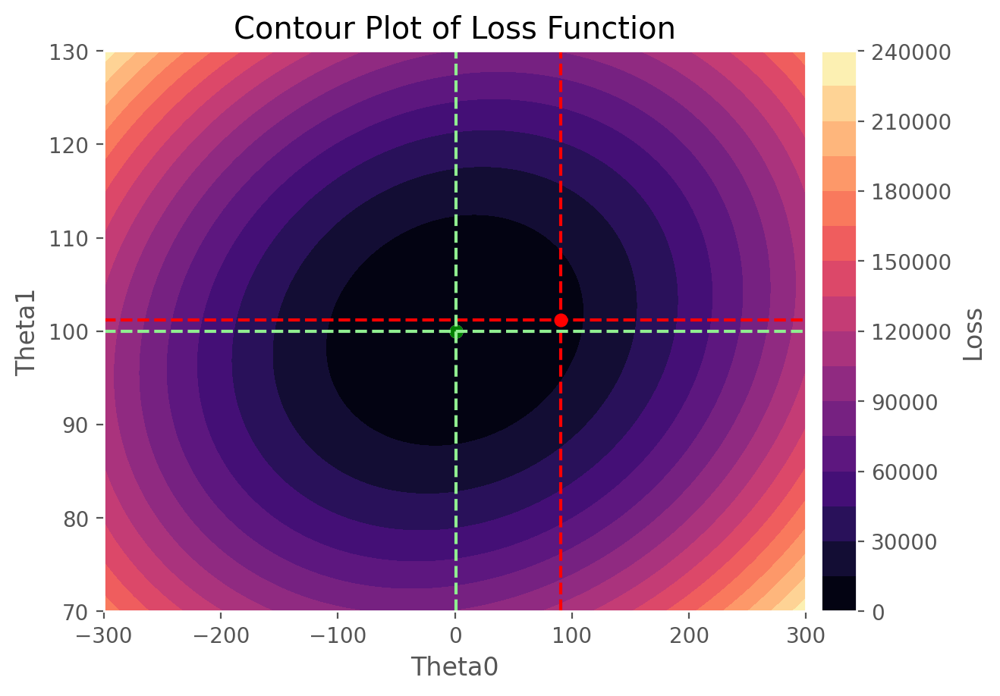

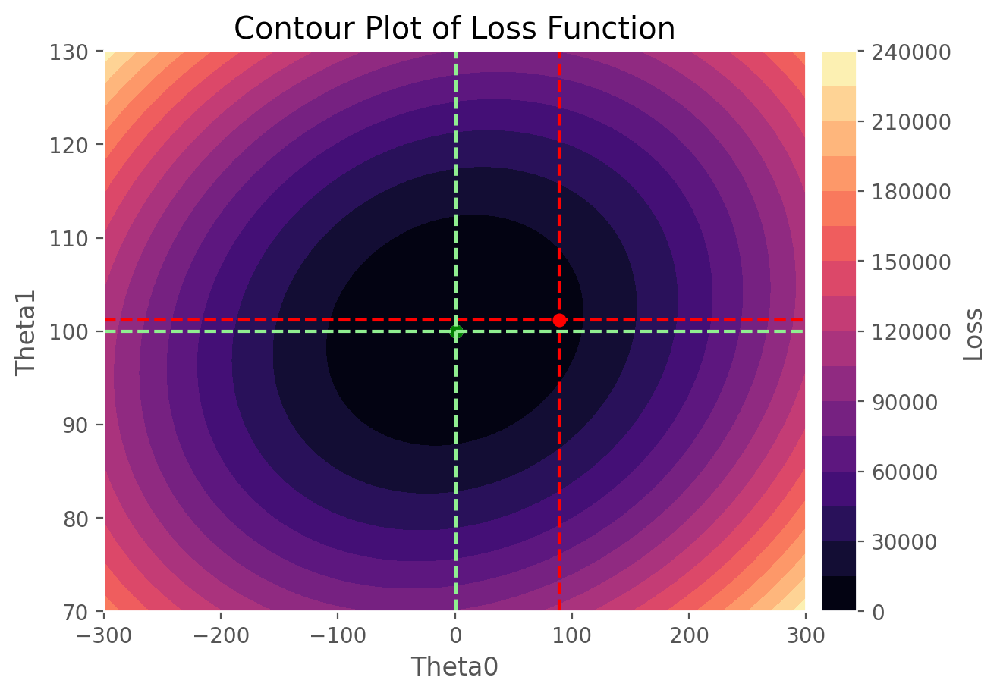

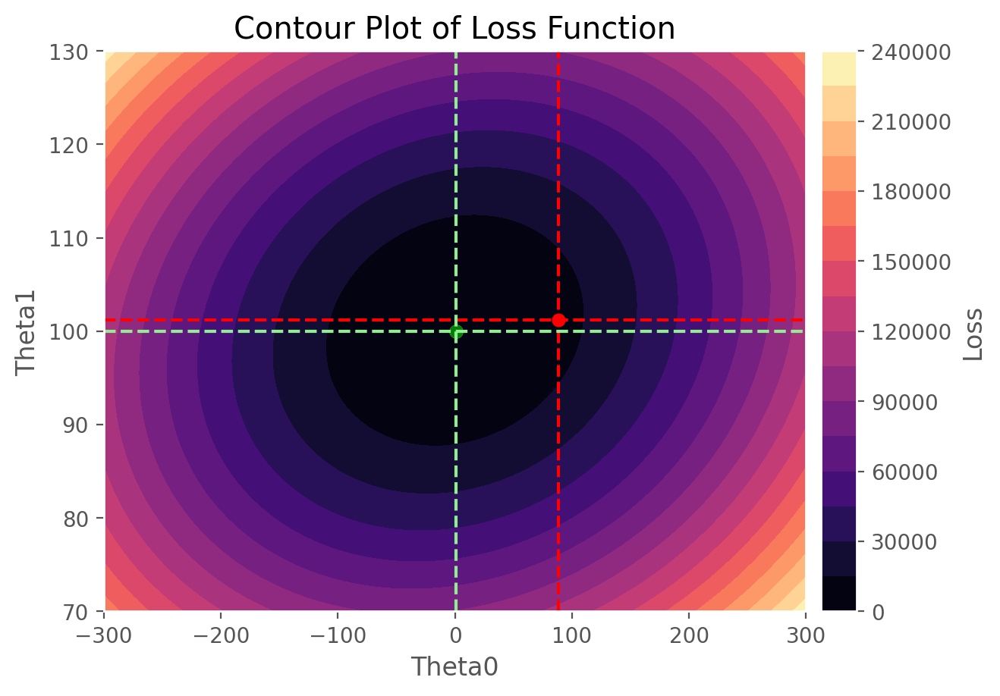

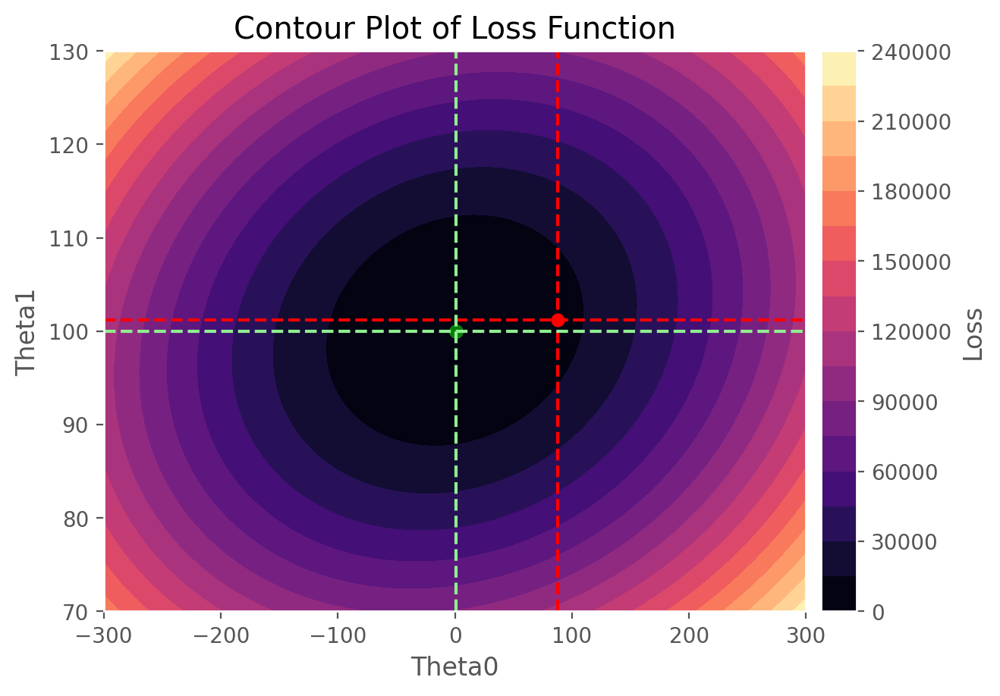

In [18]:
for i in range(15):
    create_contour(x1_new,f_x1,range0=[-300,300],range1=[70,130],minima=[1,100],scatter_pts1=theta_history_fullGD1[i],scatter_pts2=theta_history_SGD1[i])

In [14]:
# Dataset 2
alpha=0.01
epsilon=0.001
initial_theta=[100,100]
max_epochs=10000
# Full Batch
theta_fullGD2,loss_fullGD2,theta_history_fullGD2,num_epochs_fullGD2=full_batch_gradient_descent(x2_new,f_x2,initial_theta=initial_theta,learning_rate=alpha,epsilon=epsilon,max_epochs=max_epochs)

# SGD
theta_SGD2,loss_SGD2,theta_history_SGD2,num_epochs_SGD2=stochastic_gradient_descent(x2_new,f_x2,initial_theta=initial_theta,learning_rate=alpha,epsilon=epsilon,max_epochs=max_epochs)
while(len(loss_SGD2)<=100):
    loss_SGD2.append(loss_SGD2[-1])

10610.488254910297
10446.98638058903
10286.467697860144
10128.87408546721
9974.148579338638
9822.235349392073
9673.07967680473
9526.627931740295
9382.827551523174
9241.627019251124
9102.975842837486
8966.8245344743
8833.124590507961
8701.828471719014
8572.889583998025
8446.262259409574
8321.901737636515
8199.764147796934
8079.806490626235
7961.986621017111
7846.263230910094
7732.595832527737
7620.9447419454755
7511.271062992392
7403.5366714752945
7297.704199719566
7193.7370214204475
7091.599236798518
6991.255658053227
6892.671795108528
6795.813841644718
6700.6486614107325
6607.1437748112785
6515.2673457632645
6424.988168816109
6336.275656530648
6249.099827111443
6163.431292287355
6079.241245435453
5996.501449943338
5915.184227805081
5835.262448446115
5756.70951777243
5679.499367439625
5603.60644433734
5529.005700284784
5455.672581933091
5383.583020870351
5312.713423925265
5243.040663665392
5174.542069086138
5107.195416486579
5040.978920528425
4975.871225474422
4911.851396602586
4848.89

In [90]:
print(f"The value of theta0 and theta1 are respectively {theta_fullGD2[0]} and {theta_fullGD2[1]}")
print(num_epochs_fullGD2)

The value of theta0 and theta1 are respectively 4.088309359159041 and 3.7241180391243507
1633


In [91]:
print(f"The value of theta0 and theta1 are respectively {theta_SGD2[0]} and {theta_SGD2[1]}")
print(num_epochs_SGD2)

The value of theta0 and theta1 are respectively 4.009506362681136 and 3.0743389879049543
59


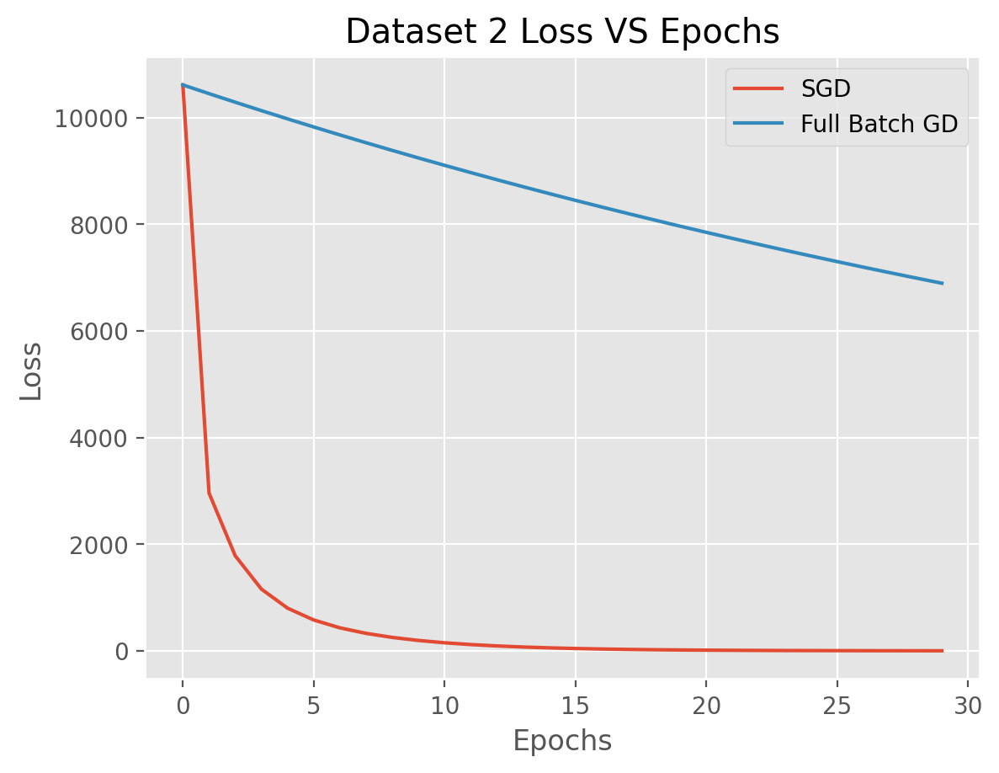

In [52]:
plt.plot(loss_SGD2[0:30],label='SGD')
plt.plot(loss_fullGD2[0:30],label='Full Batch GD')
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Dataset 2 Loss VS Epochs")
plt.show()

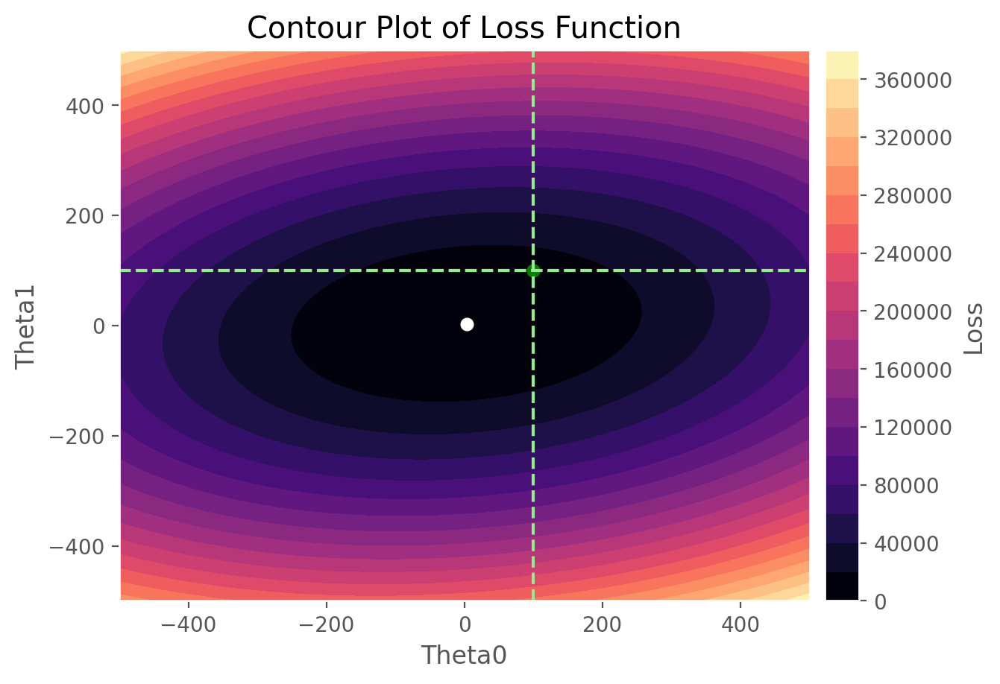

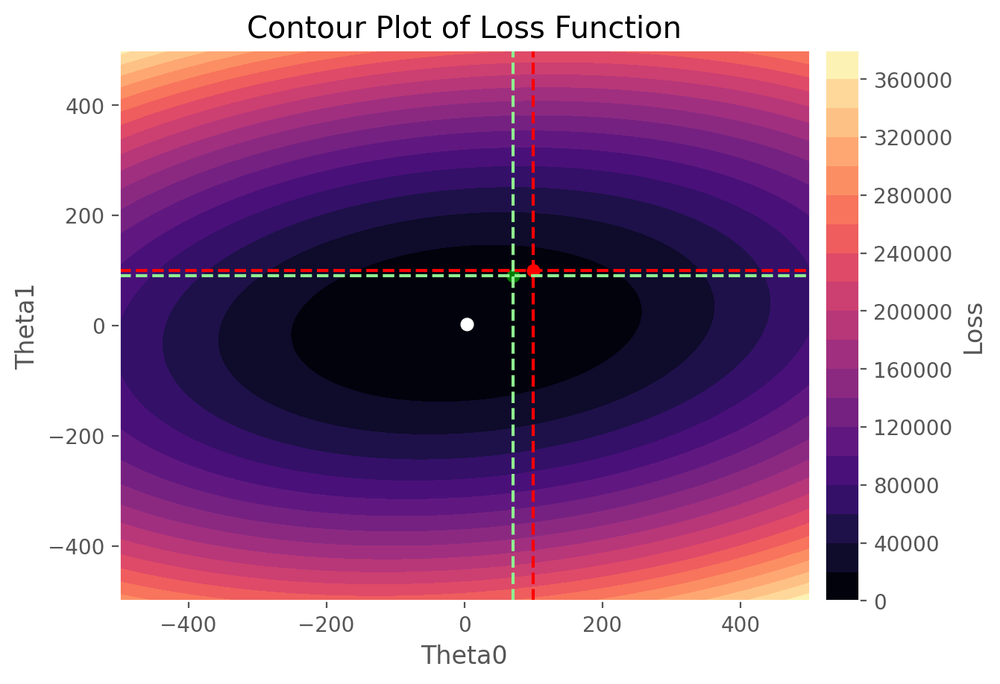

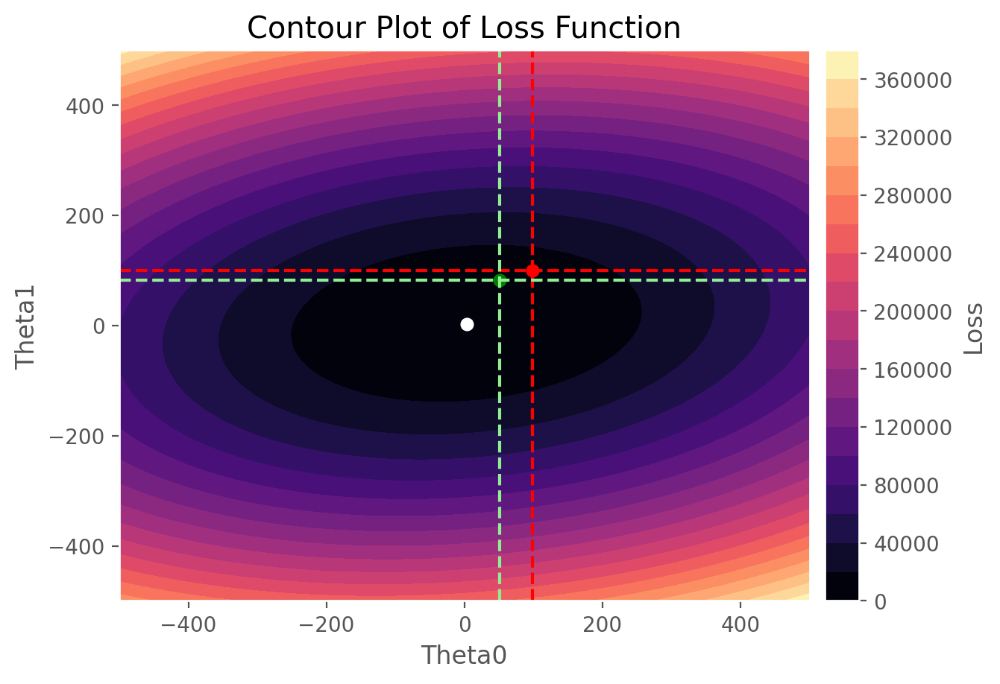

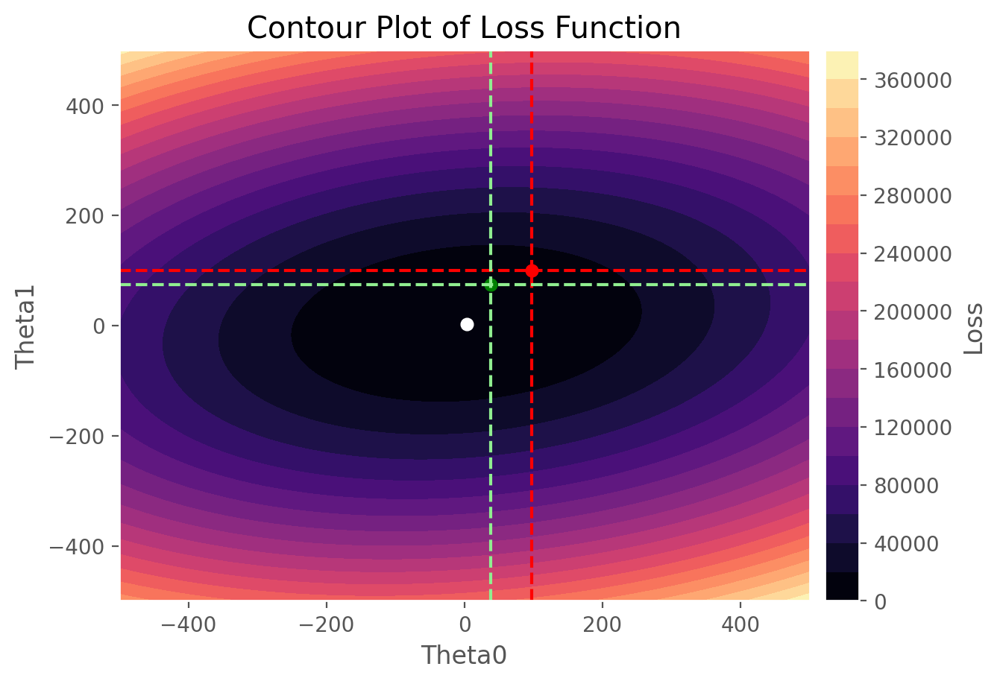

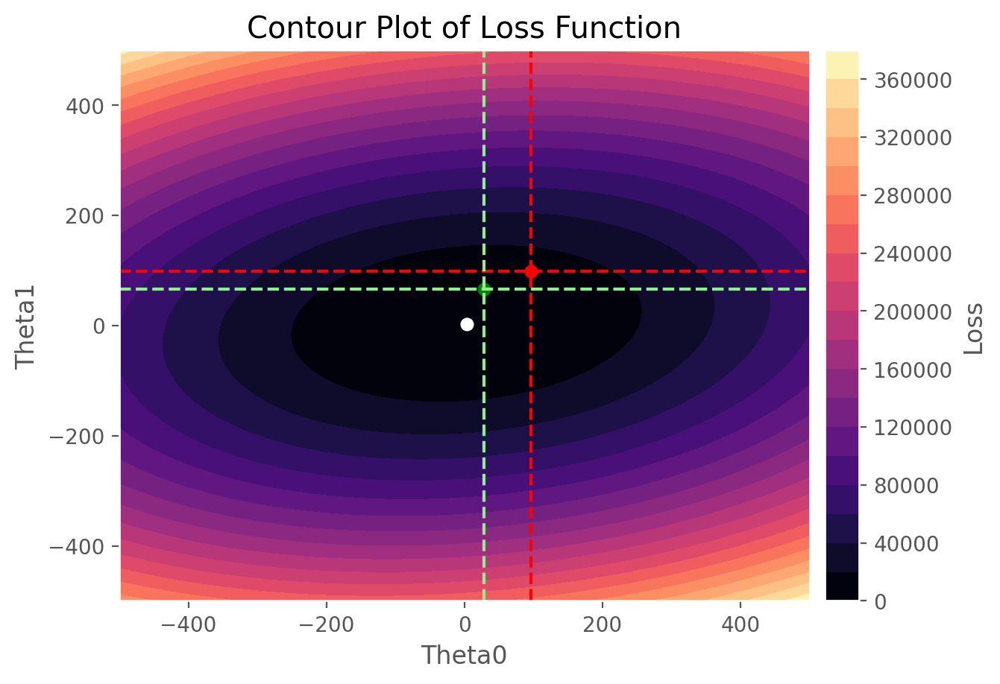

...

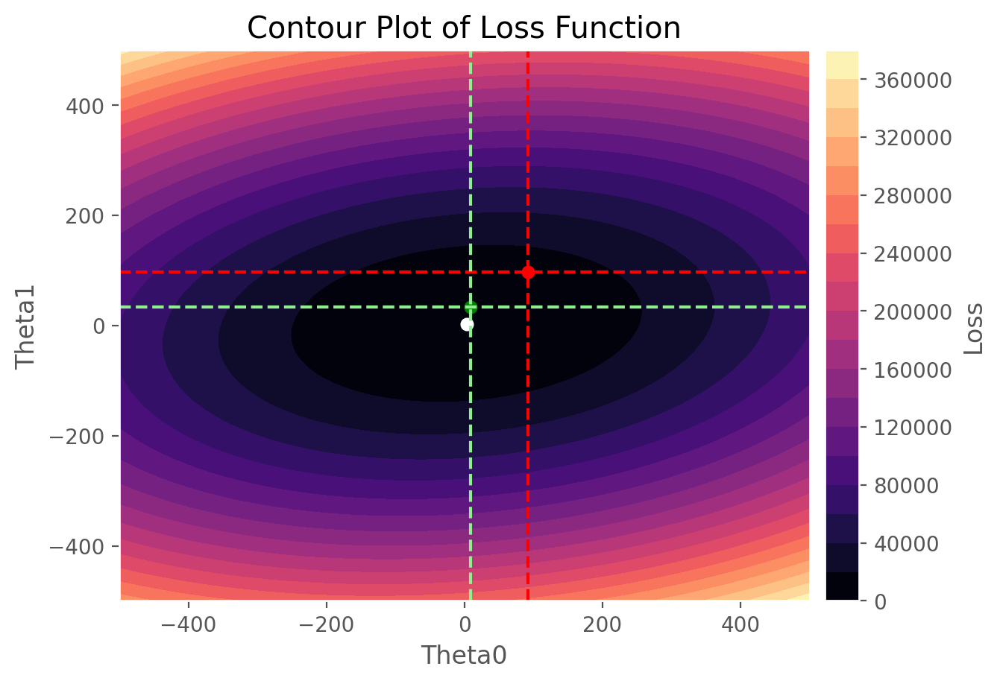

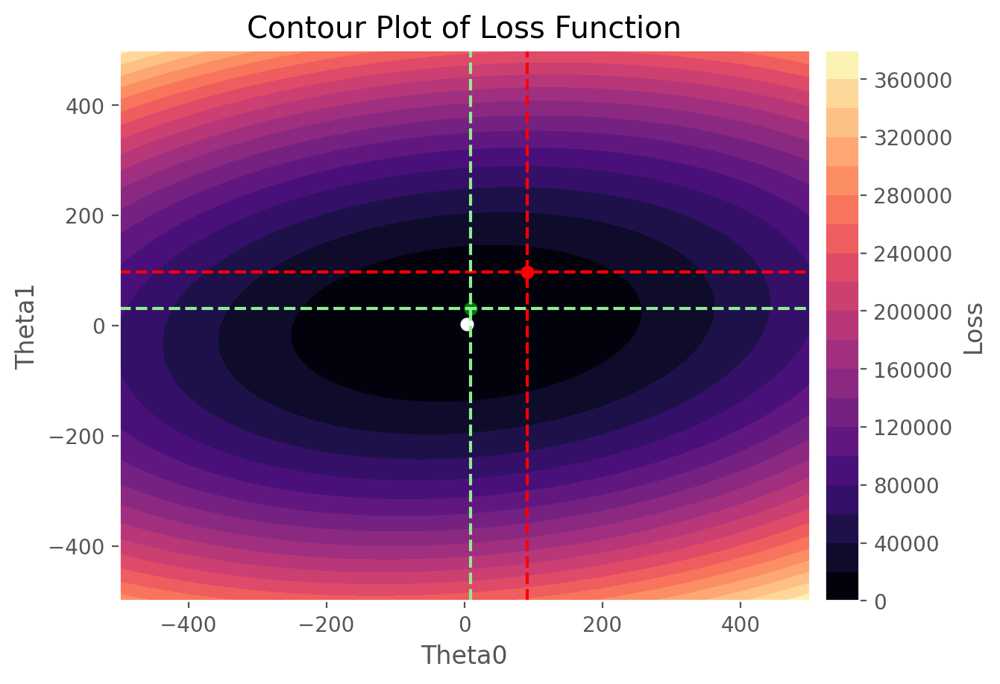

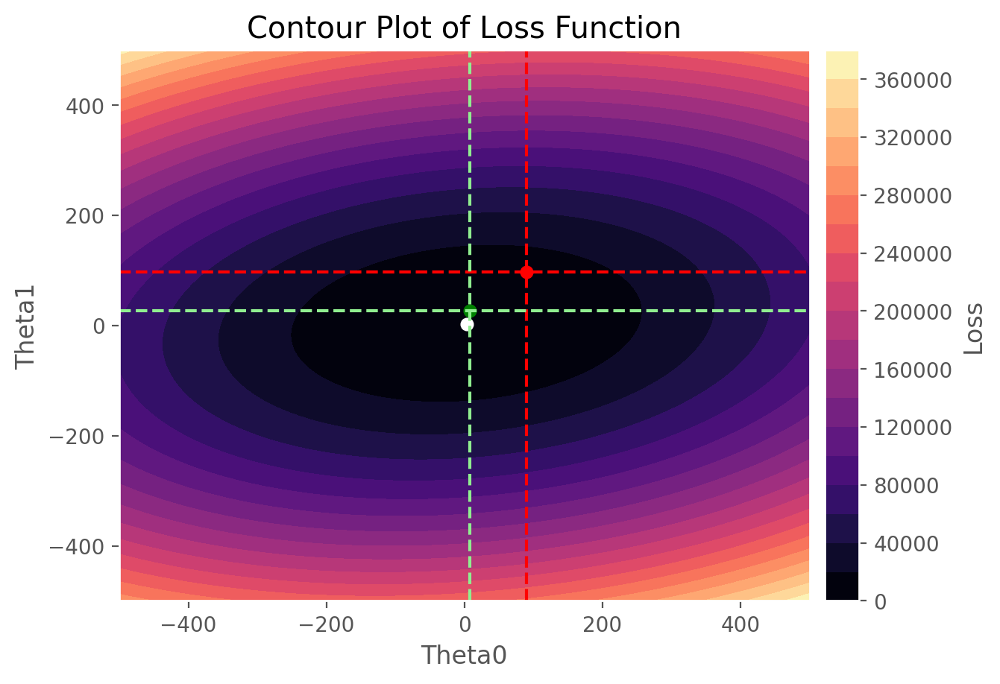

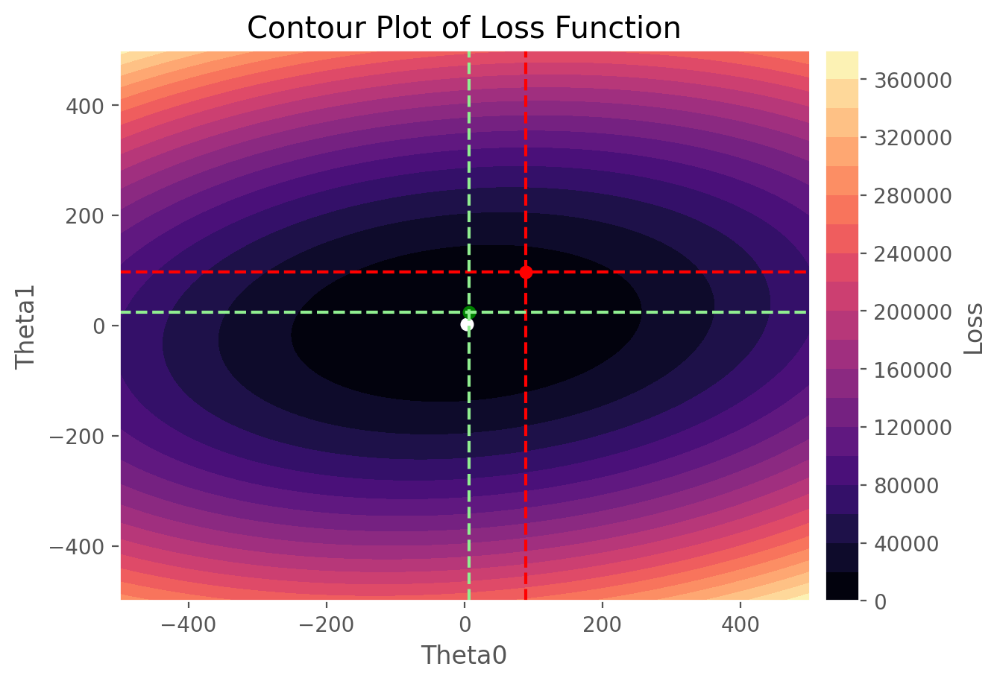

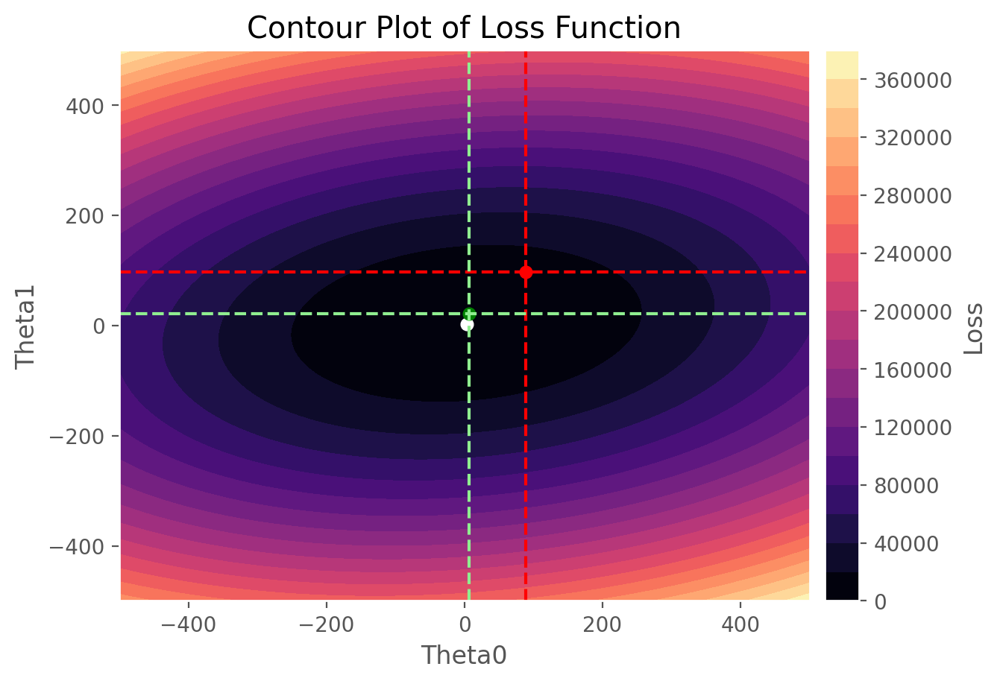

In [25]:
for i in range(15):
    create_contour(x2_new,f_x2,range0=[-500,500],range1=[-500,500],minima=[4,3],scatter_pts1=theta_history_fullGD2[i],scatter_pts2=theta_history_SGD2[i])

# Part 2

In [35]:
def full_batch_GD_momentum(X, y,initial_theta=-1, learning_rate=0.01,betta=0.1, epsilon=0.001, max_epochs=100):
    # Initialize parameters randomly
    if(initial_theta==-1):
        theta = np.random.randn(X.shape[1])
    else:
        theta = initial_theta
    if(X.ndim==1):
        X= np.hstack((np.ones((X.shape[0],1)), X))
    learning_rate=0.01
    # theta = np.array([20.,60.])
    count_epochs=0
    loss_history = [loss_function(theta,X,y)]
    theta_history = [theta.copy()]
    prevloss= float("inf")
    change_lst=[]
    change=0
    for _ in range(max_epochs):
        gradient = np.dot(X.T, (np.dot(X, theta) - y)) / len(y)
        newchange = learning_rate * gradient + betta*change
        theta -= newchange
        change=newchange
        change_lst.append(change.copy())
        loss = loss_function(theta,X,y)
        loss_history.append(loss.copy())
        theta_history.append(theta.copy())
        count_epochs+=1
        if (prevloss-loss) < epsilon:
            break
        prevloss=loss.copy()
    return theta, loss_history,theta_history,count_epochs,change_lst

a,b,c,d,_=full_batch_GD_momentum(x1_new,f_x1,initial_theta=[3,150])
print(a)
print(loss_function(a,x1_new,f_x1))

[ 3.53834994 99.85727325]
10.24412380625414


In [36]:
def stochastic_gradient_descent_momentum(X, y,initial_theta=-1, learning_rate=0.01,betta=0.1, epsilon=0.001, max_epochs=100):
    if(initial_theta==-1):
        theta = np.random.randn(len(y))
    else: 
        theta=initial_theta
    if(X.ndim==1):
        X=X.reshape(-1,1)
        X= np.hstack((np.ones((X.shape[0],1)), X))
    # theta=np.array([100.,100.])
    epochLoss=0
    count_epochs=0
    loss_history = [loss_function(theta,X,y)]
    theta_history = [theta.copy()]
    prevloss=loss_history[0].copy()
    change_lst=[]
    change=0
    for _ in range(max_epochs):
        for i in range(len(y)):
            gradient = np.dot(X[i].T, (np.dot(X[i], theta) - y[i]))
            newchange = learning_rate * gradient + betta*change
            theta -= newchange
            change=newchange
            change_lst.append(change.copy())
        loss = np.mean((np.dot(X, theta) - y) ** 2) / 2
        loss_history.append(loss.copy())
        theta_history.append(theta.copy())
        count_epochs+=1
        if (prevloss-loss) < epsilon:
            break
        prevloss=loss.copy()
    return theta, loss_history,theta_history,count_epochs,change_lst

a,b,c,d,_=stochastic_gradient_descent_momentum(x1_new,f_x1,initial_theta=[3,150])
print(a)
print(d)
print(loss_function(a,x1_new,f_x1))

[ 0.97422932 99.9996394 ]
10
0.0006490751794257323


### Dataset 1

In [17]:
# Dataset 1
alpha=0.01
epsilon=0.001
initial_theta=[100,125]
max_epochs=10000
betta=0.1
# Full Batch
theta_fullGDM1,loss_fullGDM1,theta_history_fullGDM1,num_epochs_fullGDM1,change_fullGDM1=full_batch_GD_momentum(x1_new,f_x1,initial_theta=initial_theta,learning_rate=alpha,betta=betta,epsilon=epsilon,max_epochs=max_epochs)

# SGD
theta_SGDM1,loss_SGDM1,theta_history_SGDM1,num_epochs_SGDM1,change_SGDM1=stochastic_gradient_descent_momentum(x1_new,f_x1,initial_theta=initial_theta,learning_rate=alpha,betta=betta,epsilon=epsilon,max_epochs=max_epochs)
while(len(loss_SGDM1)<=max_epochs):
    loss_SGDM1.append(loss_SGDM1[-1])
    theta_history_SGDM1.append(theta_history_SGDM1[-1])

In [18]:
print(f"The value of theta0 and theta1 are respectively {theta_fullGDM1[0]} and {theta_fullGDM1[1]}")
print(num_epochs_fullGDM1)
print(loss_fullGDM1)

The value of theta0 and theta1 are respectively 1.2137691632101573 and 100.0028883557914
562
[80377.29144275739, 14368.041435685893, 9479.449826710395, 9140.796975043133, 8855.147154659746, 8664.569127646619, 8476.380278626648, 8293.083971615562, 8113.766807343714, 7938.329979242466, 7766.687162180128, 7598.755598350935, 7434.455065387697, 7273.707043657676, 7116.434720778168, 6962.562945023654, 6812.018189652685, 6664.7285177257345, 6520.623547725933, 6379.634419927869, 6241.693763493275, 6106.735664278294, 5974.695633336742, 5845.510576104464, 5719.118762249986, 5595.459796176963, 5474.474588164574, 5356.105326131774, 5240.295448012179, 5126.98961472618, 5016.133683737473, 4907.674683181418, 4801.560786552664, 4697.741287940214, 4596.1665777978615, 4496.788119238591, 4399.558424841451, 4304.431033960044, 4211.360490521508, 4120.302321305632, 4031.213014693567, 3944.049999876045, 3858.771626511215, 3775.3371448221997, 3693.7066861250687, 3613.8412437778766, 3535.7026545414874, 3459.25

In [19]:
print(f"The value of theta0 and theta1 are respectively {theta_SGDM1[0]} and {theta_SGDM1[1]}")
print(num_epochs_SGDM1)

The value of theta0 and theta1 are respectively 1.0152754502640935 and 100.00021374640016
13


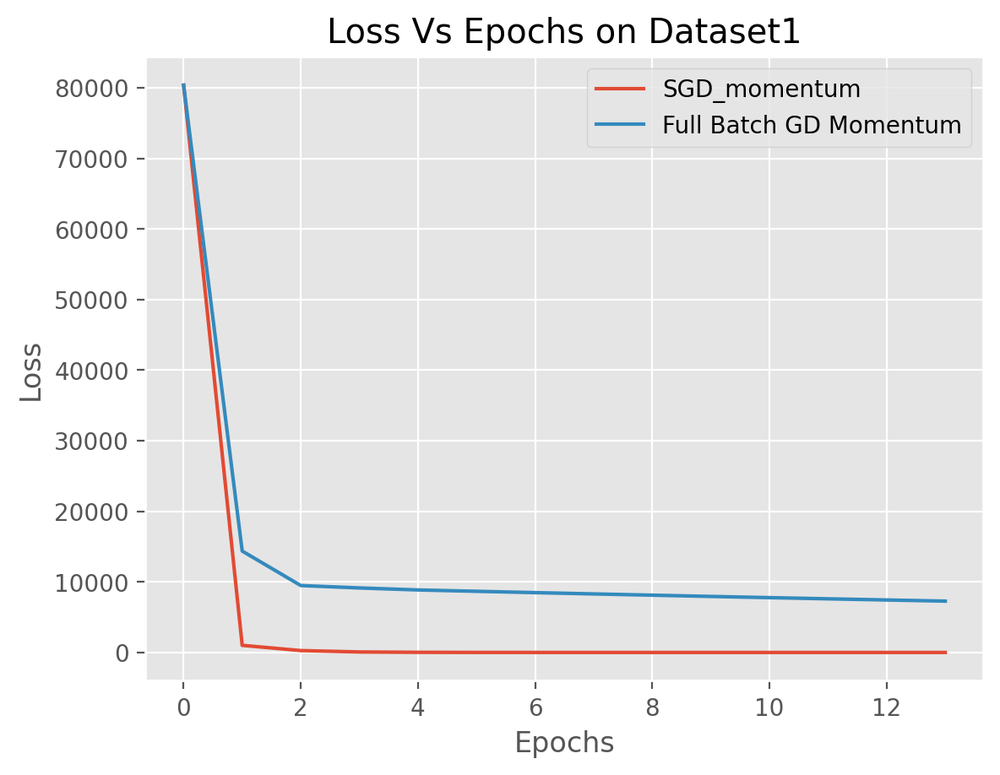

In [31]:
plt.plot(loss_SGDM1[0:14],label='SGD_momentum')
plt.plot(loss_fullGDM1[0:14],label='Full Batch GD Momentum')
plt.legend()
plt.title("Loss Vs Epochs on Dataset1")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

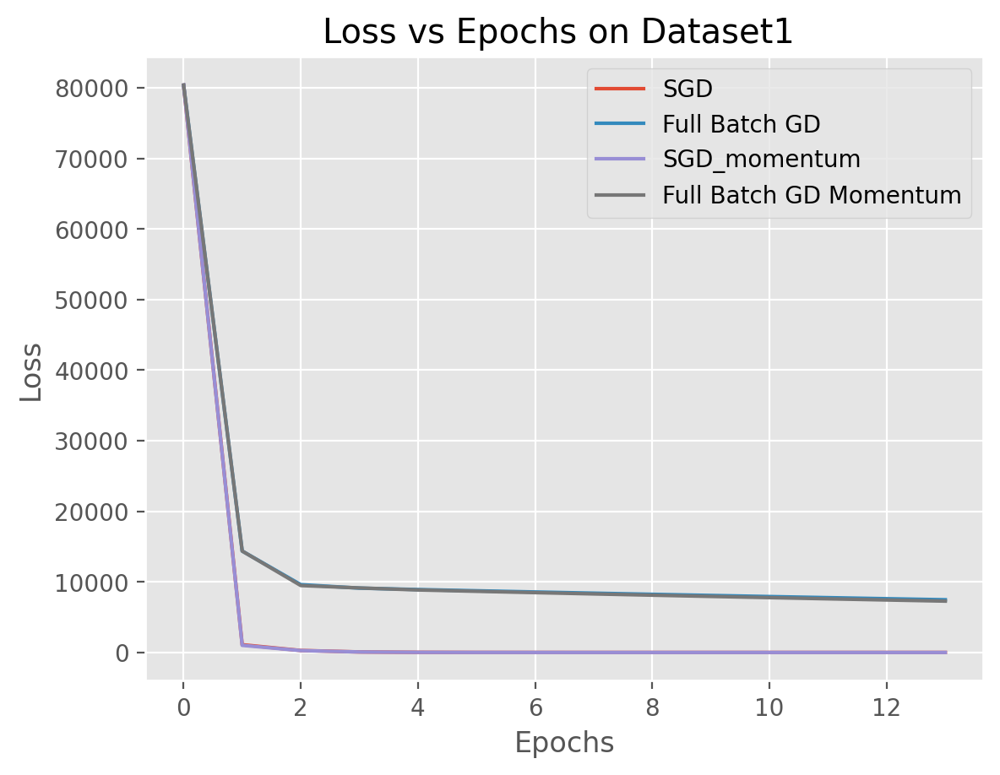

In [20]:
# Comparing performance via loss between SGD,Full_Batch and momentum version of both
plt.plot(loss_SGD1[0:14],label='SGD')
plt.plot(loss_fullGD1[0:14],label='Full Batch GD')
plt.plot(loss_SGDM1[0:14],label='SGD_momentum')
plt.plot(loss_fullGDM1[0:14],label='Full Batch GD Momentum')
# plt.yscale('log')
plt.title("Loss vs Epochs on Dataset1 ")
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

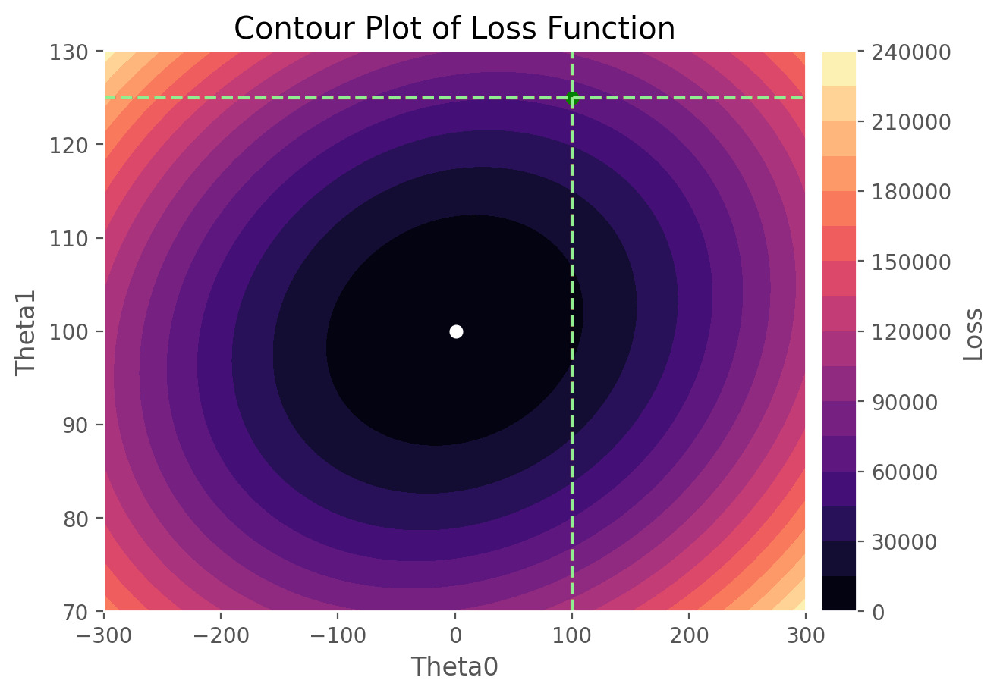

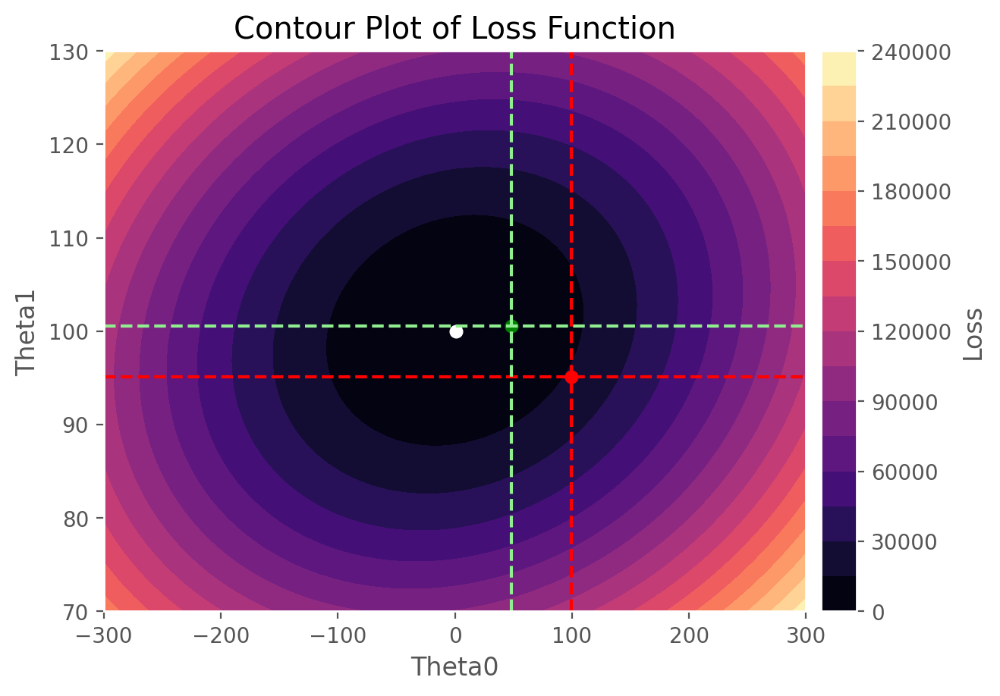

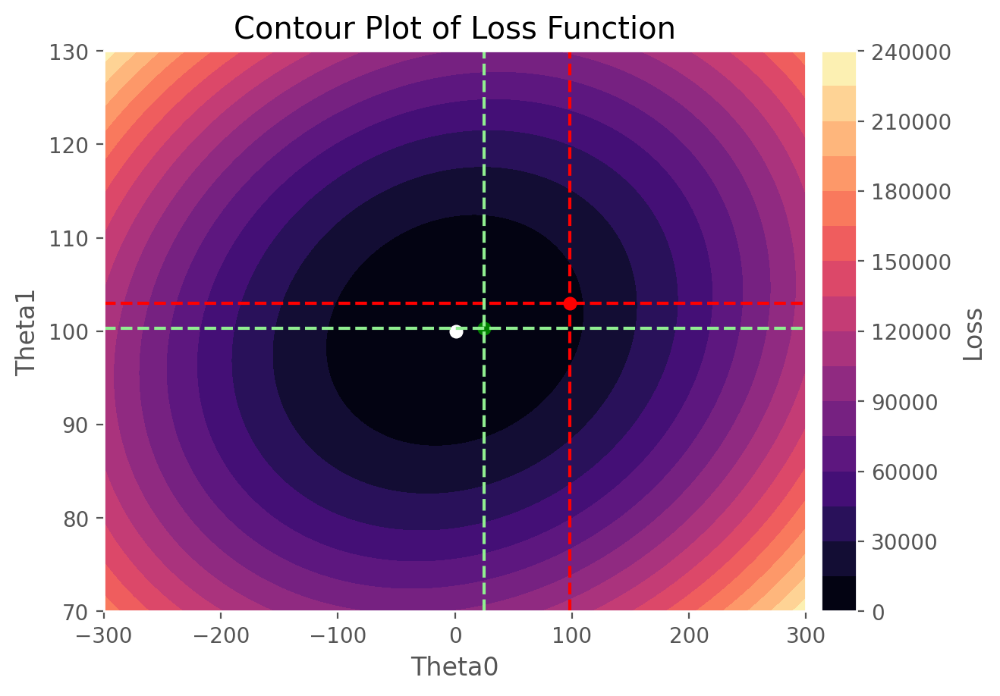

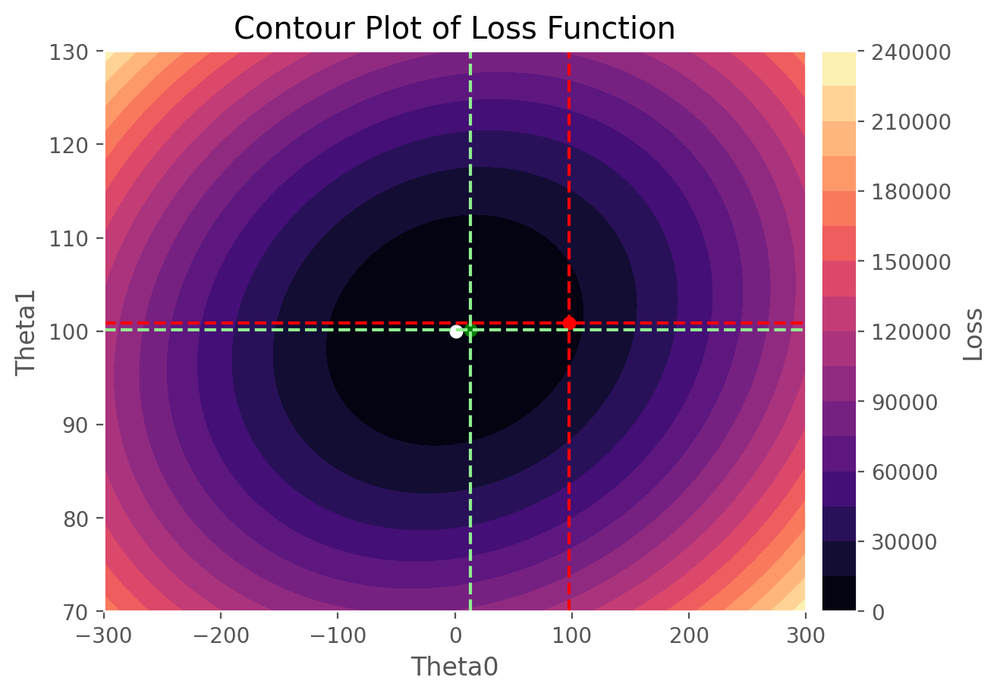

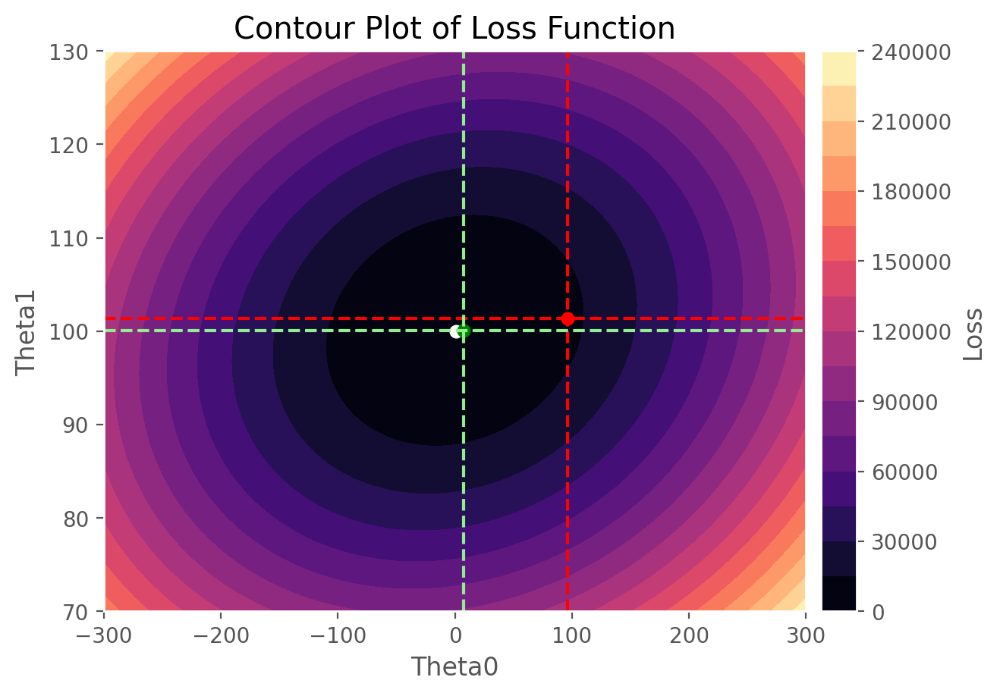

...

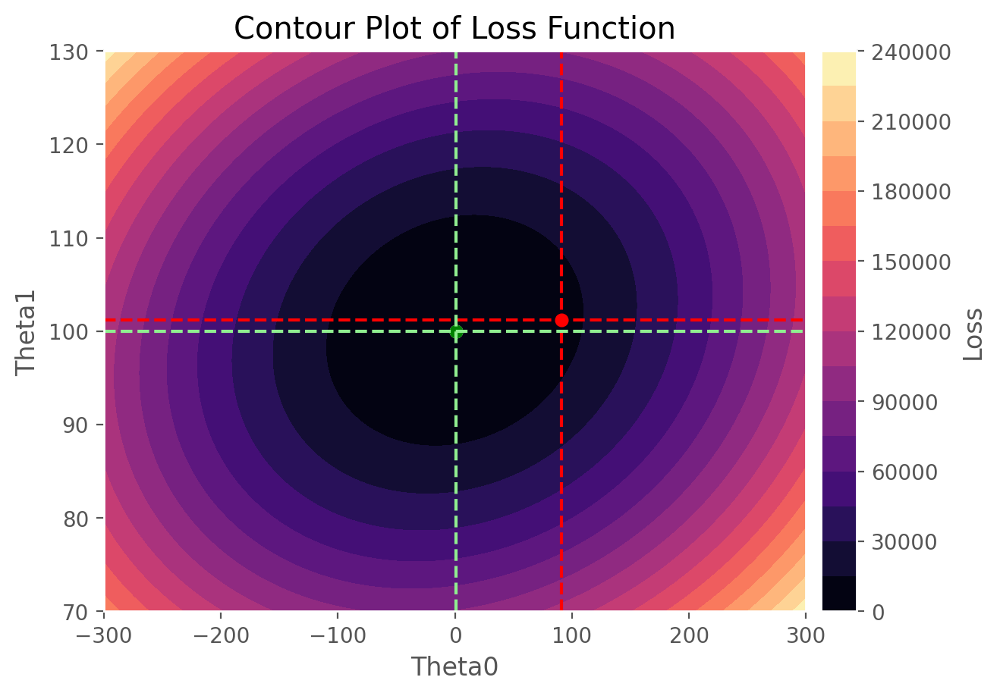

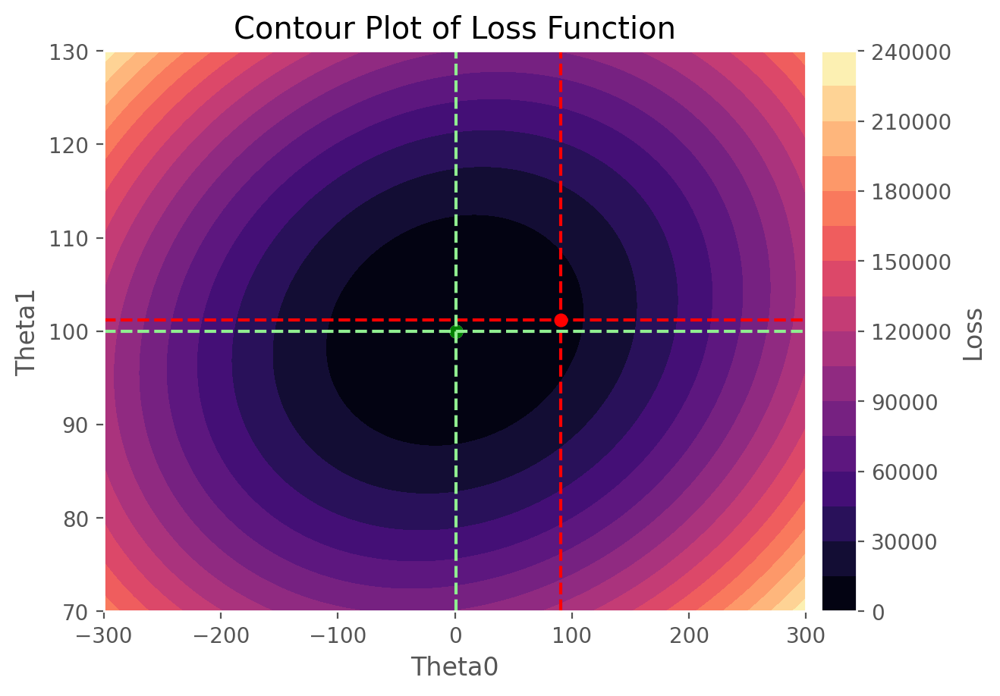

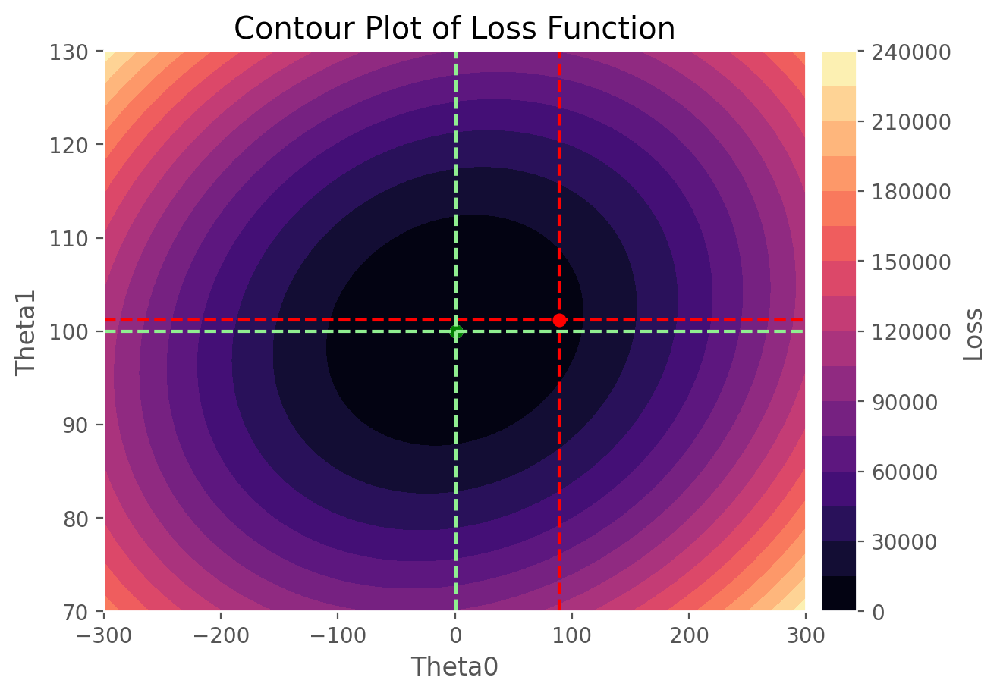

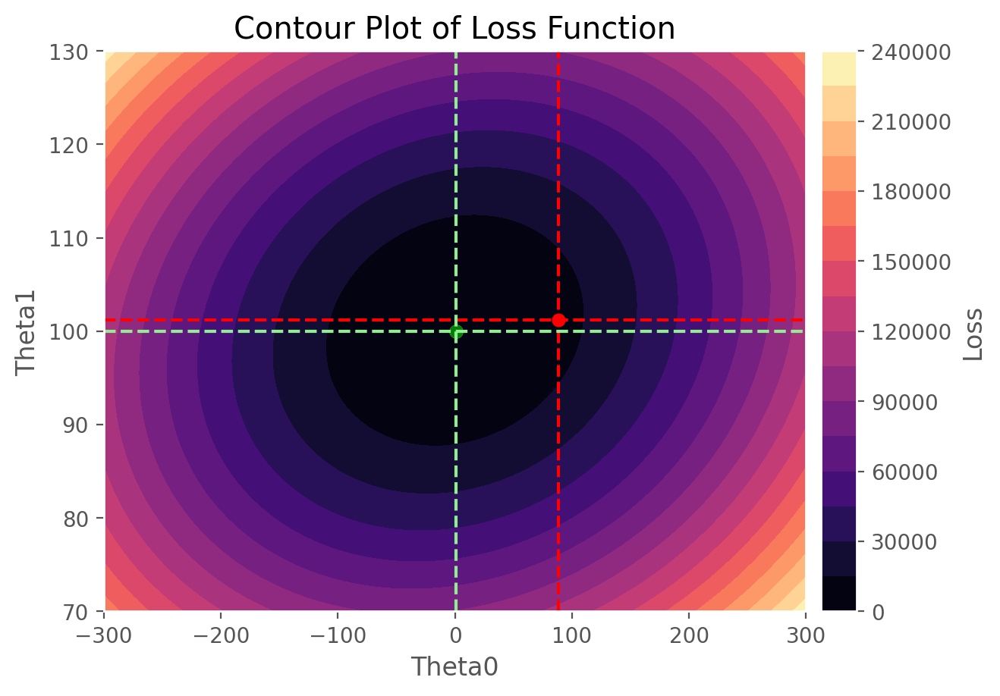

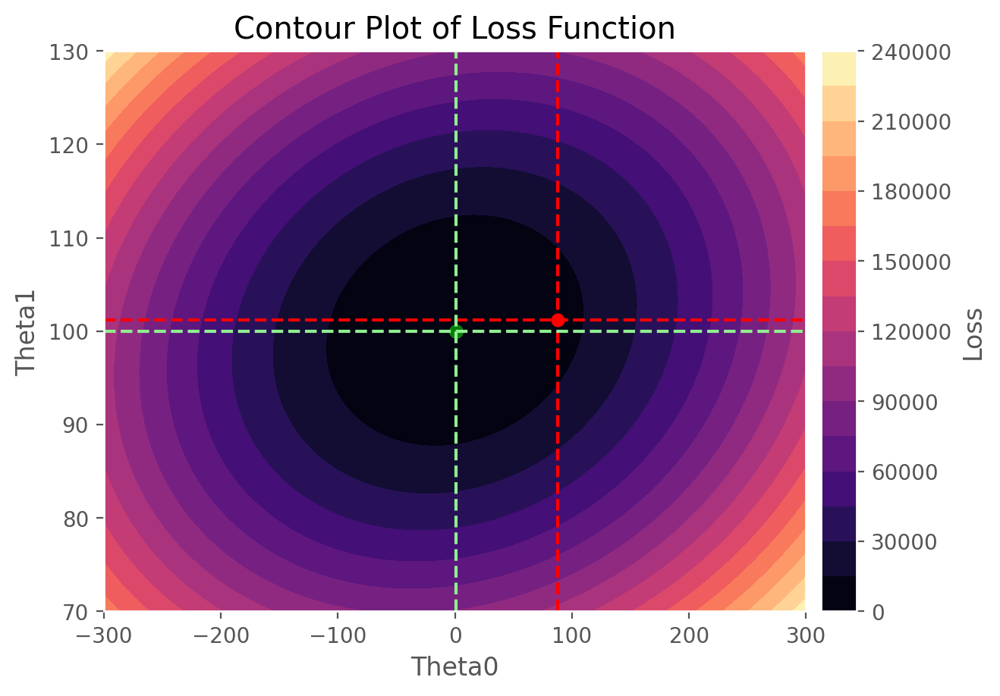

In [33]:
for i in range(15):
    create_contour(x1_new,f_x1,range0=[-300,300],range1=[70,130],minima=[1,100],scatter_pts1=theta_history_fullGD1[i],scatter_pts2=theta_history_SGD1[i])

In [80]:
# theta_history_SGDM1[1:15]
a=0
b=15
theta0_SGD1 = [item[0] for item in theta_history_SGD1[a:b]]
theta0_SGDM1 = [item[0] for item in theta_history_SGDM1[a:b]]
theta0_full1 = [item[0] for item in theta_history_fullGD1[a:b]]
theta0_fullM1 = [item[0] for item in theta_history_fullGDM1[a:b]]

In [81]:
# theta_history_SGDM1[1:15]
a=0
b=15
theta1_SGD1 = [item[1] for item in theta_history_SGD1[a:b]]
theta1_SGDM1 = [item[1] for item in theta_history_SGDM1[a:b]]
theta1_full1 = [item[1] for item in theta_history_fullGD1[a:b]]
theta1_fullM1 = [item[1] for item in theta_history_fullGDM1[a:b]]

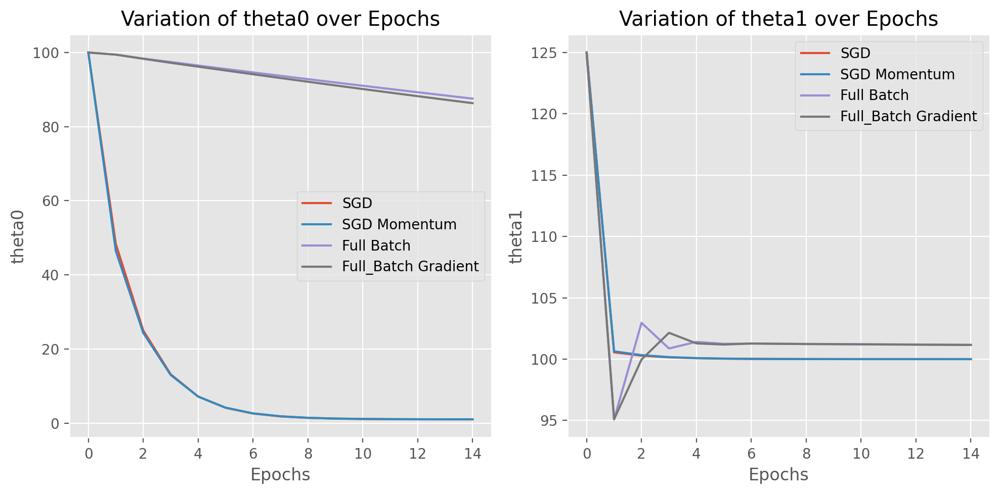

In [82]:
plt.figure(figsize=(10, 5))

# First subplot
plt.subplot(1, 2, 1)  # 1 row, 2 columns, 1st subplot
plt.plot(range(b-a),theta0_SGD1,label='SGD')
plt.plot(range(b-a),theta0_SGDM1,label='SGD Momentum')
plt.plot(range(b-a),theta0_full1,label='Full Batch')
plt.plot(range(b-a),theta0_fullM1,label='Full_Batch Gradient')
plt.xlabel("Epochs")
plt.ylabel("theta0")
plt.legend()
plt.title('Variation of theta0 over Epochs')

# Second subplot
plt.subplot(1, 2, 2)  # 1 row, 2 columns, 2nd subplot
plt.plot(range(b-a),theta1_SGD1,label='SGD')
plt.plot(range(b-a),theta1_SGDM1,label='SGD Momentum')
plt.plot(range(b-a),theta1_full1,label='Full Batch')
plt.plot(range(b-a),theta1_fullM1,label='Full_Batch Gradient')
plt.xlabel("Epochs")
plt.ylabel("theta1")
plt.legend()
plt.title('Variation of theta1 over Epochs')

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()

In [22]:
change_SGDM1=np.array(change_SGDM1).reshape(-1,2)
change_fullGDM1=np.array(change_fullGDM1).reshape(-1,2)

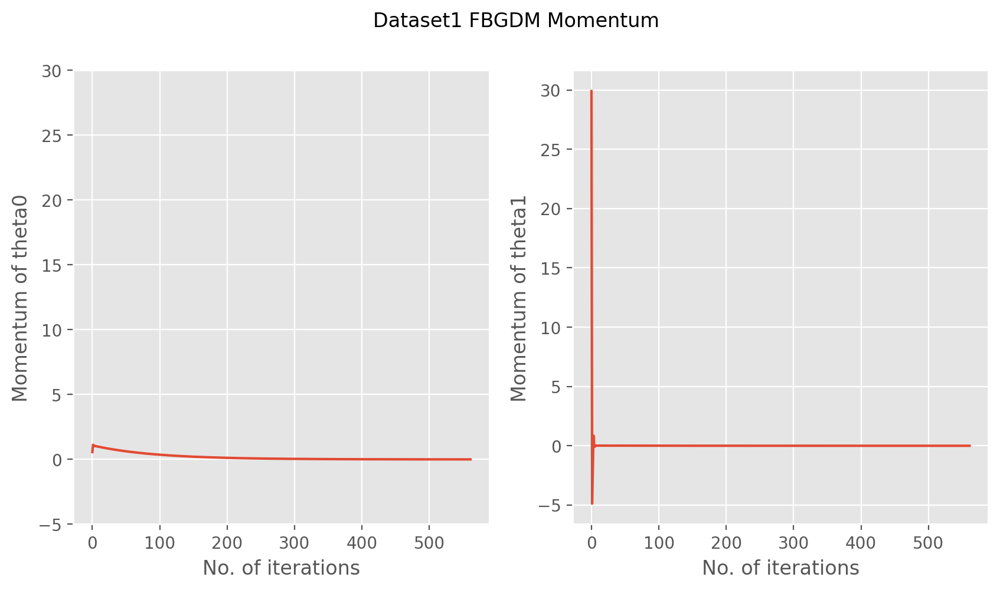

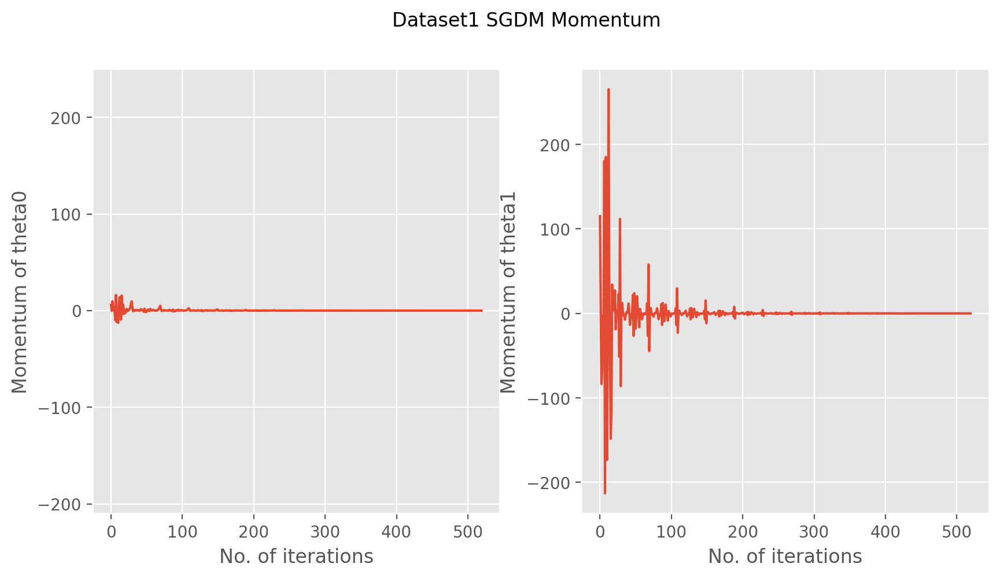

In [24]:
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.plot(range(len(change_fullGDM1[:,0])),change_fullGDM1[:,0])
plt.xlabel("No. of iterations")
plt.ylabel("Momentum of theta0")
plt.ylim(-5,30)
plt.subplot(1,2,2)
plt.plot(range(len(change_fullGDM1[:,1])),change_fullGDM1[:,1])
plt.xlabel("No. of iterations")
plt.ylabel("Momentum of theta1")
plt.suptitle("Dataset1 FBGDM Momentum")
plt.show()

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.plot(range(len(change_SGDM1[:,0])),change_SGDM1[:,0])
plt.ylim(-210,250)
plt.xlabel("No. of iterations")
plt.ylabel("Momentum of theta0")
plt.subplot(1,2,2)
plt.plot(range(len(change_SGDM1[:,1])),change_SGDM1[:,1])
plt.xlabel("No. of iterations")
plt.ylabel("Momentum of theta1")
plt.suptitle("Dataset1 SGDM Momentum")
plt.show()

### Dataset 2

In [37]:
# Dataset 2
alpha=0.01
epsilon=0.001
initial_theta=[100,100]
max_epochs=10000
betta=0.1
# Full Batch
theta_fullGDM2,loss_fullGDM2,theta_history_fullGDM2,num_epochs_fullGDM2,change_fullGDM2=full_batch_GD_momentum(x2_new,f_x2,initial_theta=initial_theta,learning_rate=alpha,betta=betta,epsilon=epsilon,max_epochs=max_epochs)

theta_SGDM2,loss_SGDM2,theta_history_SGDM2,num_epochs_SGDM2,change_SGDM2=stochastic_gradient_descent_momentum(x2_new,f_x2,initial_theta=initial_theta,learning_rate=alpha,betta=betta,epsilon=epsilon,max_epochs=max_epochs)
while(len(loss_SGDM2)<=max_epochs):
    loss_SGDM2.append(loss_SGDM2[-1])
    theta_history_SGDM2.append(theta_history_SGDM2[-1])

In [38]:
print(f"The value of theta0 and theta1 are respectively {theta_fullGDM2[0]} and {theta_fullGDM2[1]}")
print(num_epochs_fullGDM2)

The value of theta0 and theta1 are respectively 4.0836319807954355 and 3.6857701697043255
1485


In [39]:
print(f"The value of theta0 and theta1 are respectively {theta_SGDM2[0]} and {theta_SGDM2[1]}")
print(num_epochs_SGDM2)

The value of theta0 and theta1 are respectively 4.01651335975405 and 3.1293288986197427
49


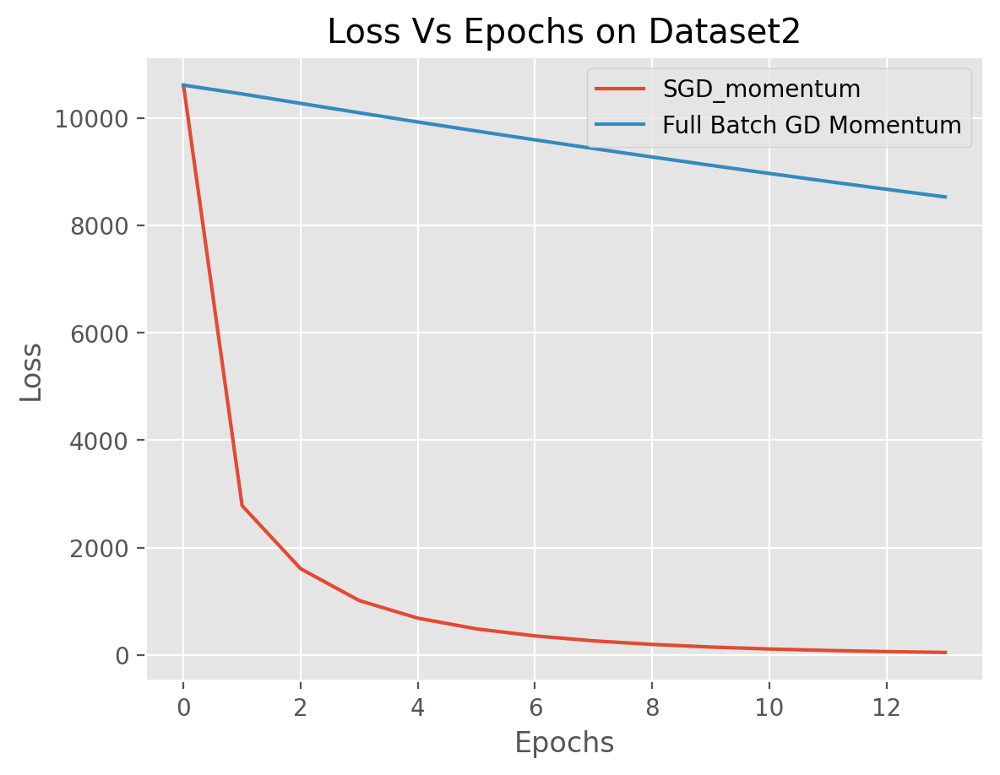

In [40]:
plt.plot(loss_SGDM2[0:14],label='SGD_momentum')
plt.plot(loss_fullGDM2[0:14],label='Full Batch GD Momentum')
plt.legend()
plt.title("Loss Vs Epochs on Dataset2")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

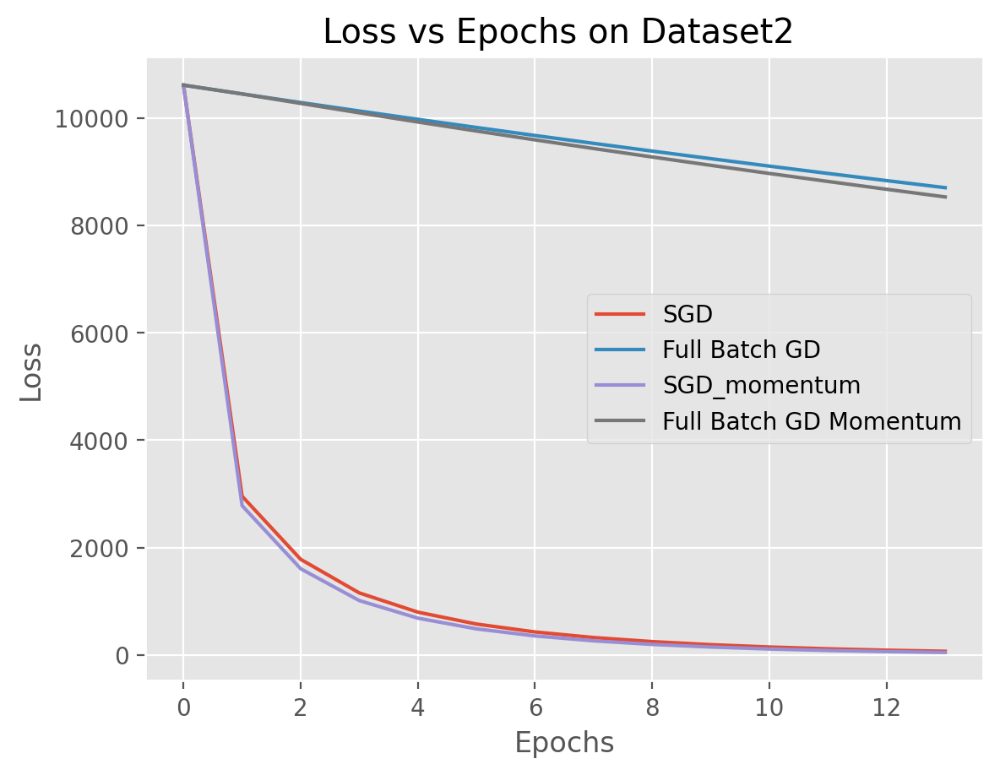

In [41]:
# Comparing performance via loss between SGD,Full_Batch and momentum version of both
plt.plot(loss_SGD2[0:14],label='SGD')
plt.plot(loss_fullGD2[0:14],label='Full Batch GD')
plt.plot(loss_SGDM2[0:14],label='SGD_momentum')
plt.plot(loss_fullGDM2[0:14],label='Full Batch GD Momentum')
# plt.yscale('log')
plt.title("Loss vs Epochs on Dataset2 ")
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

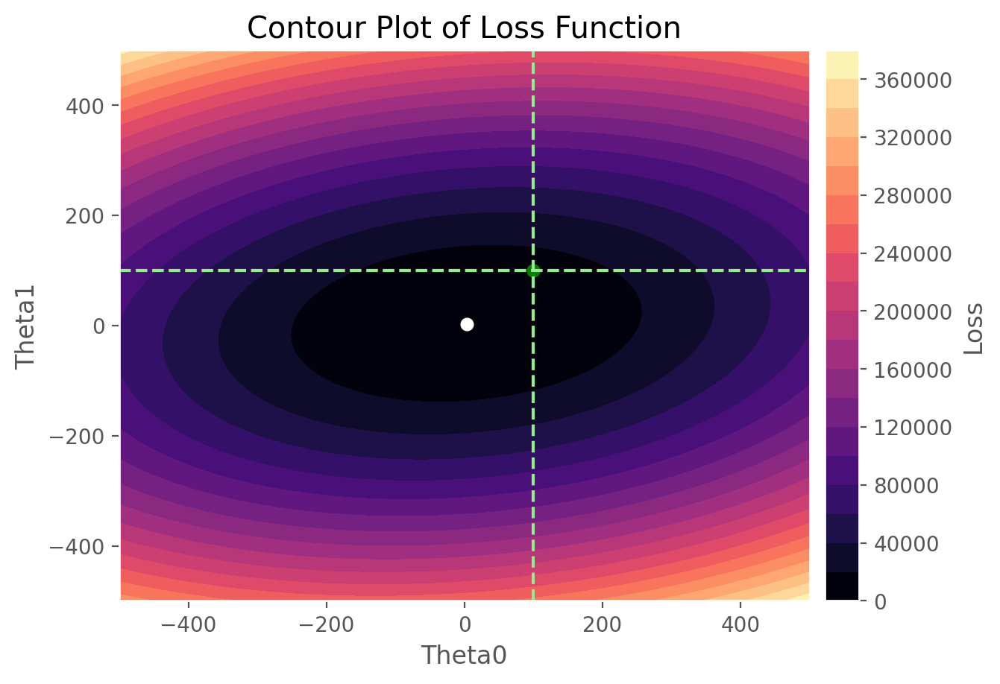

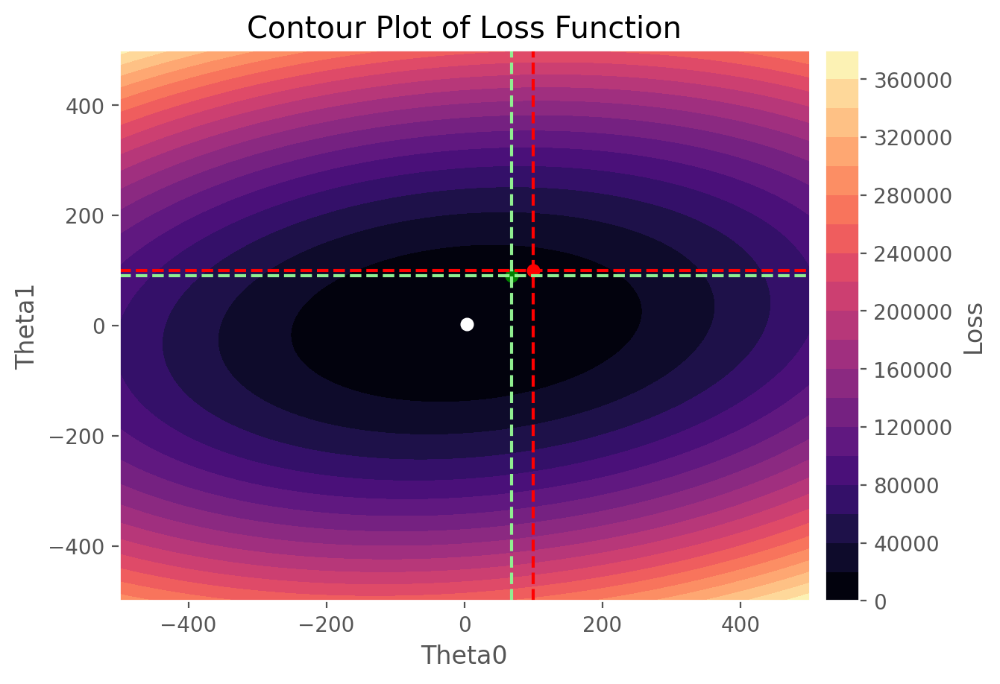

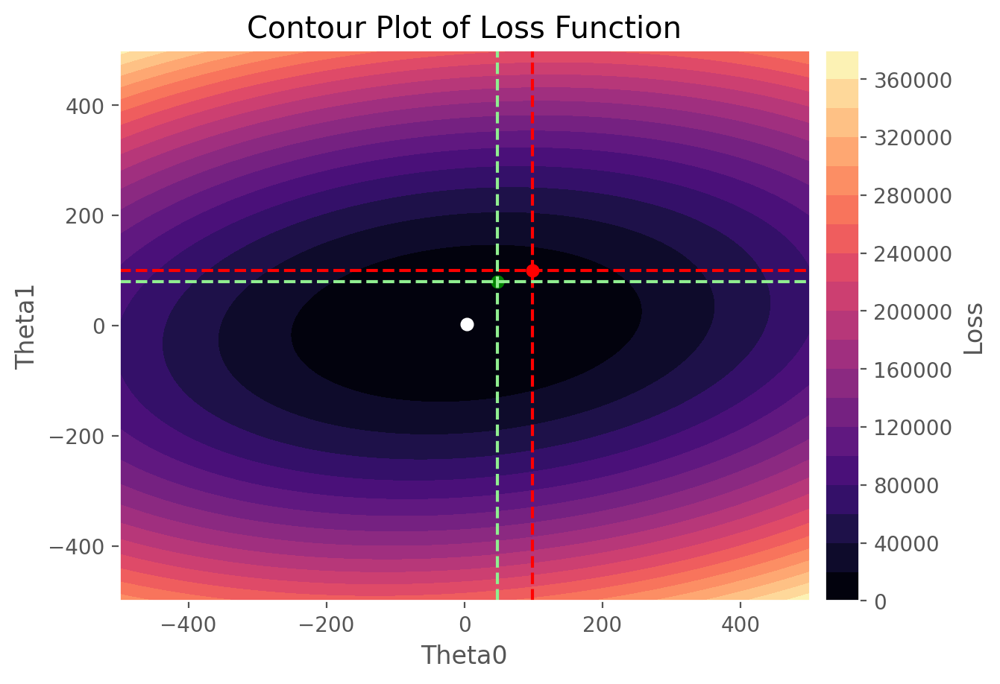

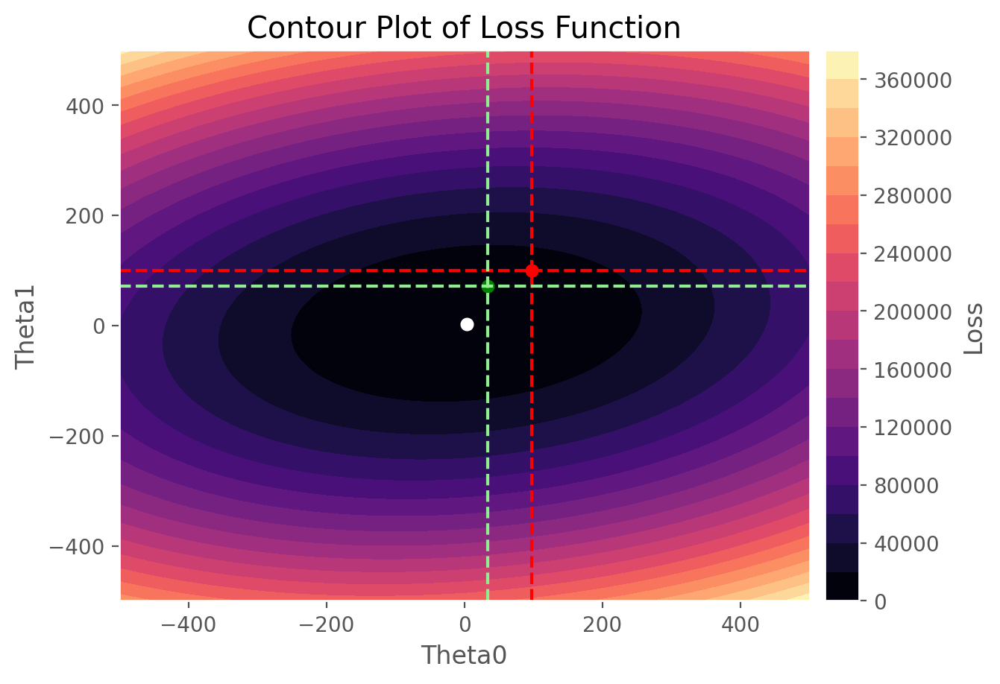

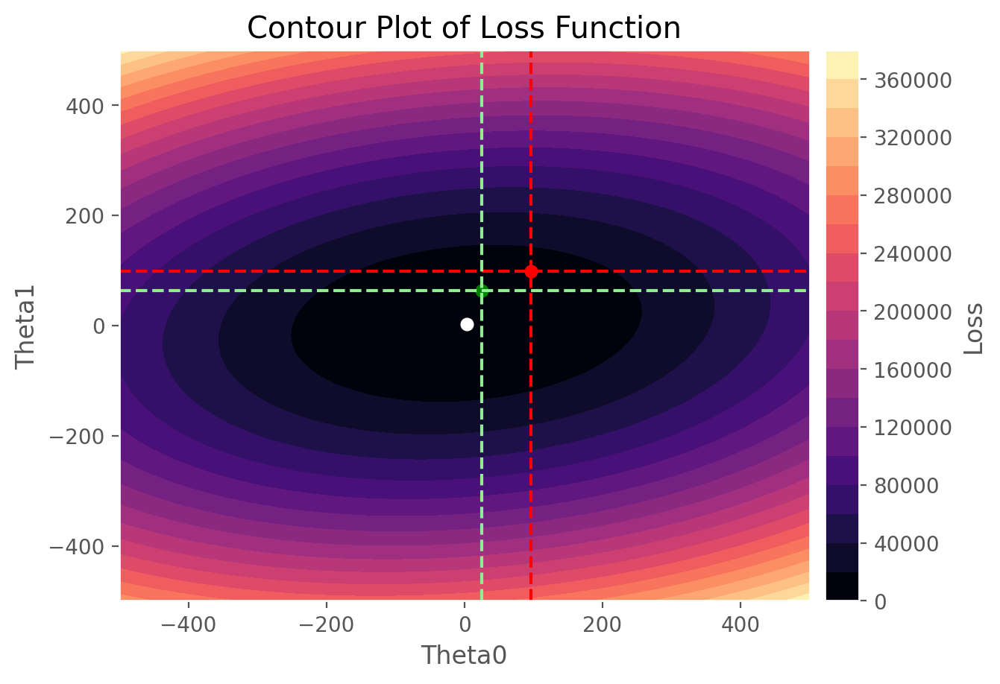

...

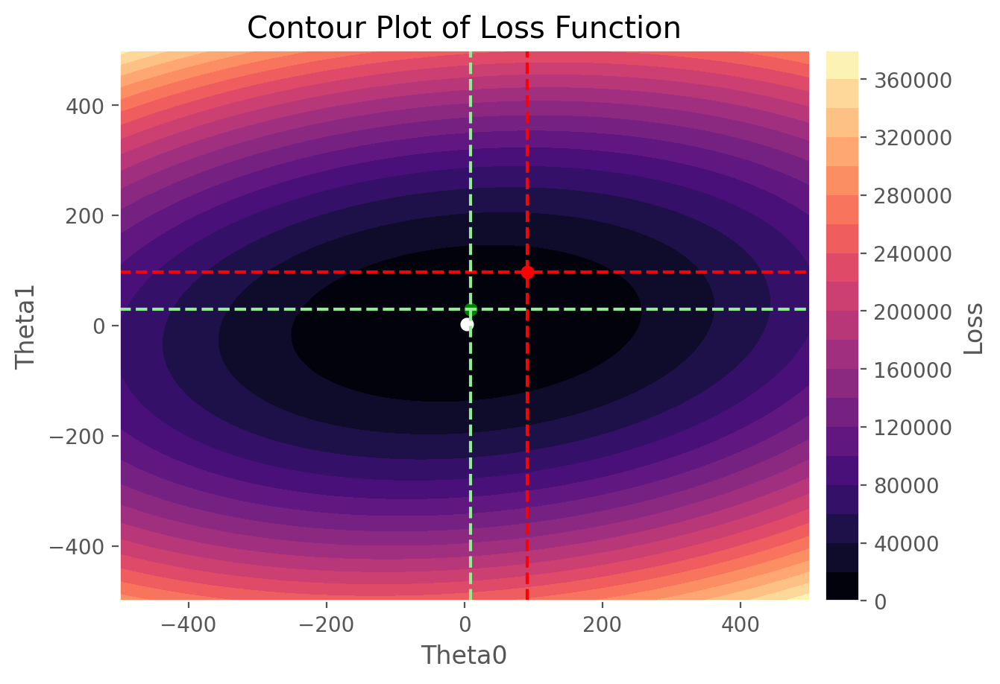

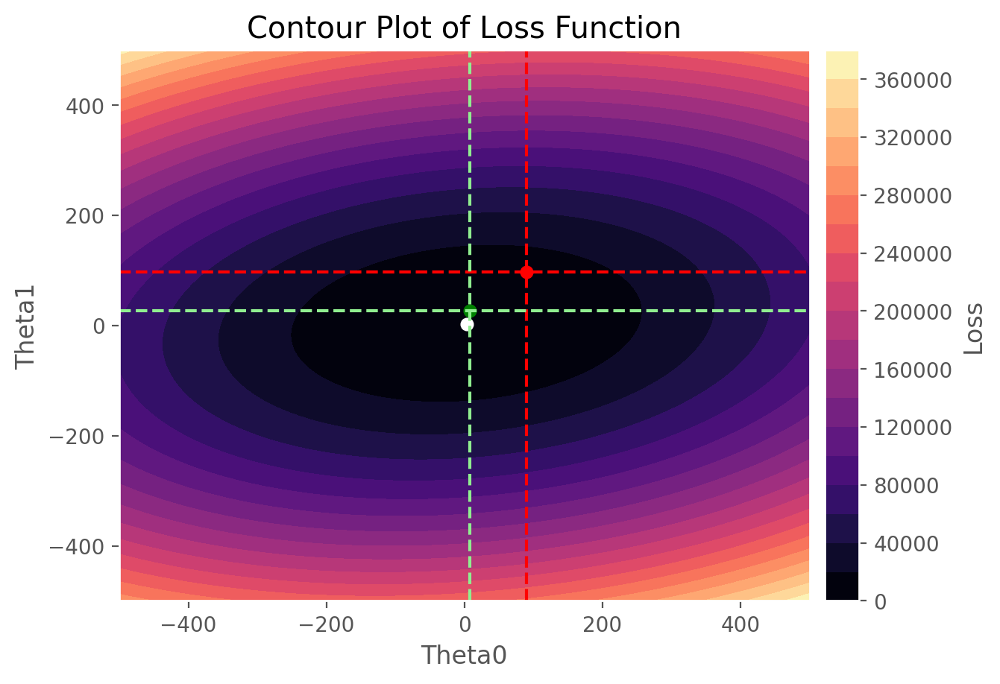

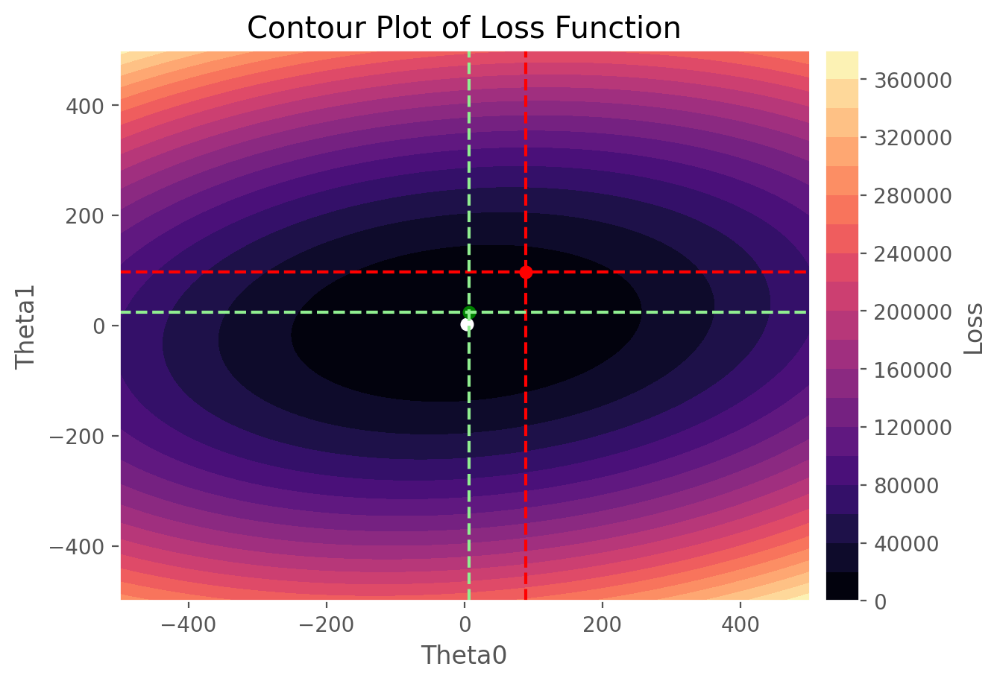

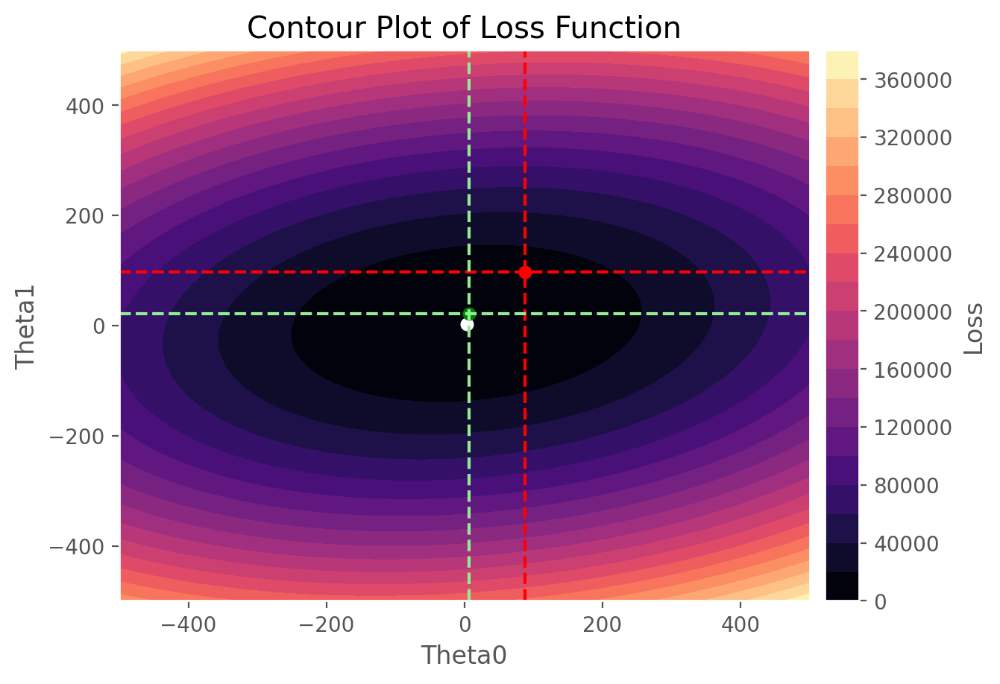

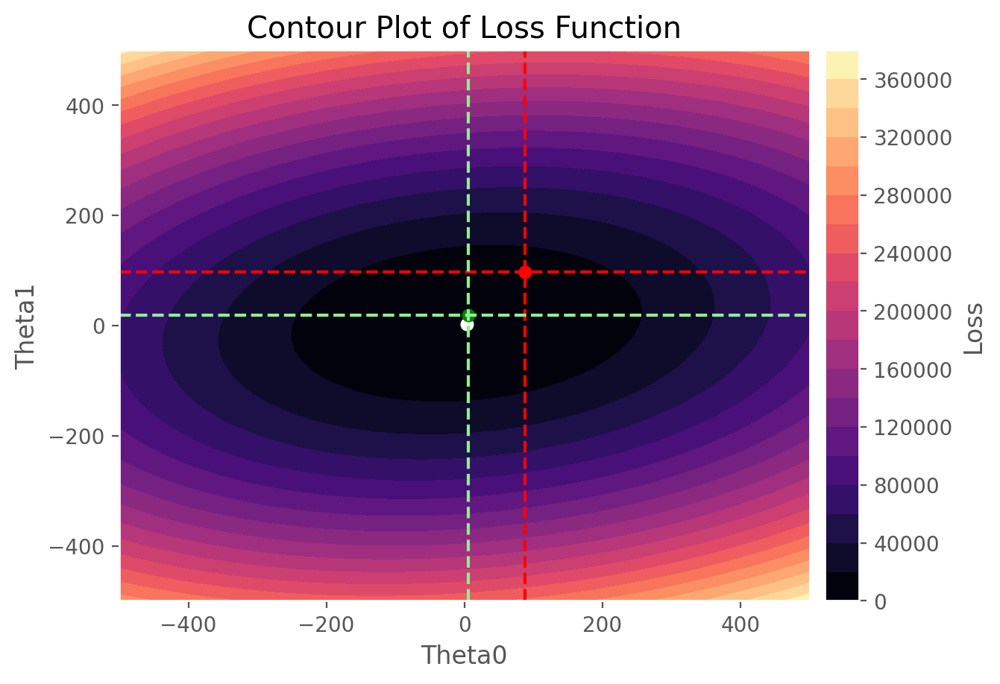

In [42]:
for i in range(15):
    create_contour(x2_new,f_x2,range0=[-500,500],range1=[-500,500],minima=[4,3],scatter_pts1=theta_history_fullGDM2[i],scatter_pts2=theta_history_SGDM2[i])

In [83]:
# theta_history_SGDM1[1:15]
a=0
b=15
theta0_SGD2 = [item[0] for item in theta_history_SGD2[a:b]]
theta0_SGDM2 = [item[0] for item in theta_history_SGDM2[a:b]]
theta0_full2 = [item[0] for item in theta_history_fullGD2[a:b]]
theta0_fullM2 = [item[0] for item in theta_history_fullGDM2[a:b]]

In [84]:
# theta_history_SGDM1[1:15]
a=0
b=15
theta1_SGD2 = [item[1] for item in theta_history_SGD2[a:b]]
theta1_SGDM2 = [item[1] for item in theta_history_SGDM2[a:b]]
theta1_full2 = [item[1] for item in theta_history_fullGD2[a:b]]
theta1_fullM2 = [item[1] for item in theta_history_fullGDM2[a:b]]

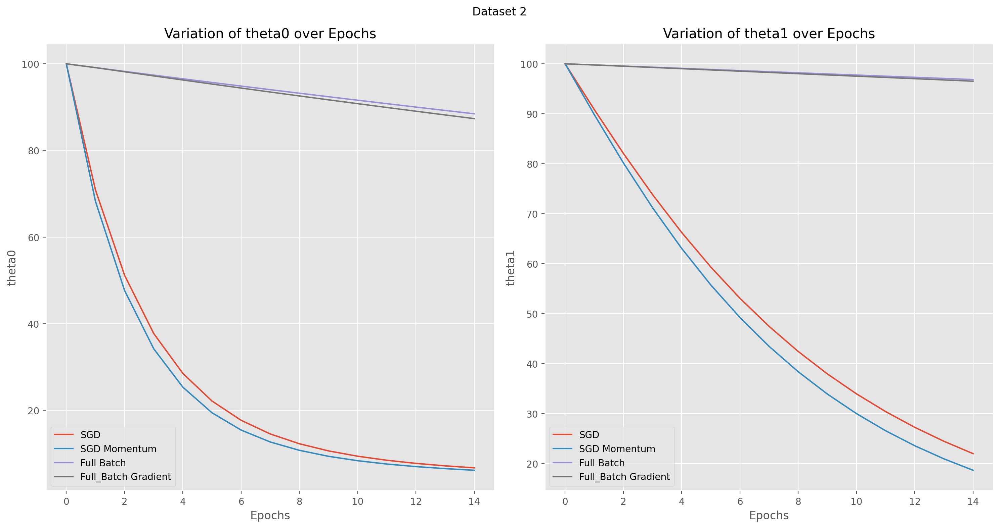

In [86]:
plt.figure(figsize=(15, 8))

# First subplot
plt.subplot(1, 2, 1)  # 1 row, 2 columns, 1st subplot
plt.plot(range(b-a),theta0_SGD2,label='SGD')
plt.plot(range(b-a),theta0_SGDM2,label='SGD Momentum')
plt.plot(range(b-a),theta0_full2,label='Full Batch')
plt.plot(range(b-a),theta0_fullM2,label='Full_Batch Gradient')
plt.xlabel("Epochs")
plt.ylabel("theta0")
plt.legend()
plt.title('Variation of theta0 over Epochs')

# Second subplot
plt.subplot(1, 2, 2)  # 1 row, 2 columns, 2nd subplot
plt.plot(range(b-a),theta1_SGD2,label='SGD')
plt.plot(range(b-a),theta1_SGDM2,label='SGD Momentum')
plt.plot(range(b-a),theta1_full2,label='Full Batch')
plt.plot(range(b-a),theta1_fullM2,label='Full_Batch Gradient')
plt.xlabel("Epochs")
plt.ylabel("theta1")
plt.legend()
plt.title('Variation of theta1 over Epochs')
plt.suptitle("Dataset 2")
# Adjust layout
plt.tight_layout()

# Show plot
plt.show()

In [130]:
change_SGDM2=np.array(change_SGDM1).reshape(-1,2)
change_fullGDM2=np.array(change_fullGDM1).reshape(-1,2)

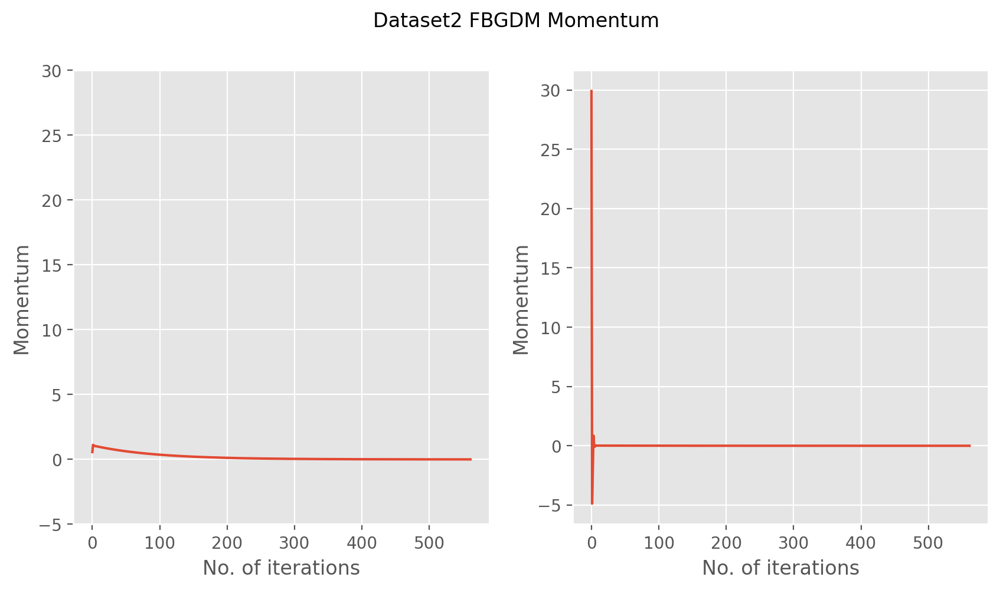

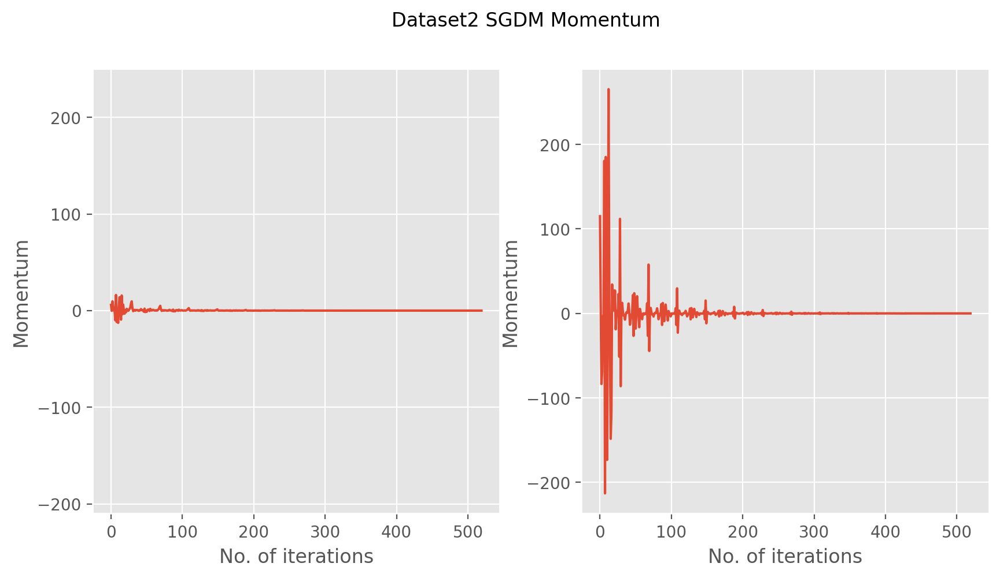

In [133]:
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.plot(range(len(change_fullGDM2[:,0])),change_fullGDM2[:,0])
plt.xlabel("No. of iterations")
plt.ylabel("Momentum")
plt.ylim(-5,30)
plt.subplot(1,2,2)
plt.plot(range(len(change_fullGDM2[:,1])),change_fullGDM2[:,1])
plt.xlabel("No. of iterations")
plt.ylabel("Momentum")
plt.suptitle("Dataset2 FBGDM Momentum")
plt.show()

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.plot(range(len(change_SGDM2[:,0])),change_SGDM2[:,0])
plt.ylim(-210,250)
plt.xlabel("No. of iterations")
plt.ylabel("Momentu of theta0")
plt.subplot(1,2,2)
plt.plot(range(len(change_SGDM2[:,1])),change_SGDM2[:,1])
plt.xlabel("No. of iterations")
plt.ylabel("Momentum of theta1")
plt.suptitle("Dataset2 SGDM Momentum")
plt.show()

### Effect of Betta on Convergence 

In [46]:
alpha=0.01
epsilon=0.001
initial_theta=[100,100]
max_epochs=100
bettas=[0.1,0.3,0.5,0.7,0.9,1]
loss_FullGDM2_lst=[]
loss_SGDM2_lst=[]

for i in range(len(bettas)):
    # Full Batch
    theta_fullGDM2,loss_FullGDM2,theta_history_fullGDM2,num_epochs_fullGDM2,_=full_batch_GD_momentum(x2_new,f_x2,initial_theta=initial_theta,learning_rate=alpha,betta=bettas[i],epsilon=epsilon,max_epochs=max_epochs)
    loss_FullGDM2_lst.append(loss_FullGDM2)
    # SGD
    theta_SGDM2,loss_SGDM2,theta_history_SGDM2,num_epochs_SGDM2,_=stochastic_gradient_descent_momentum(x2_new,f_x2,initial_theta=initial_theta,learning_rate=alpha,betta=bettas[i],epsilon=epsilon,max_epochs=max_epochs)
    loss_SGDM2_lst.append(loss_SGDM2)
    while(len(loss_SGDM2)<=max_epochs):
        loss_SGDM2_lst[i].append(loss_SGDM2_lst[i][-1])

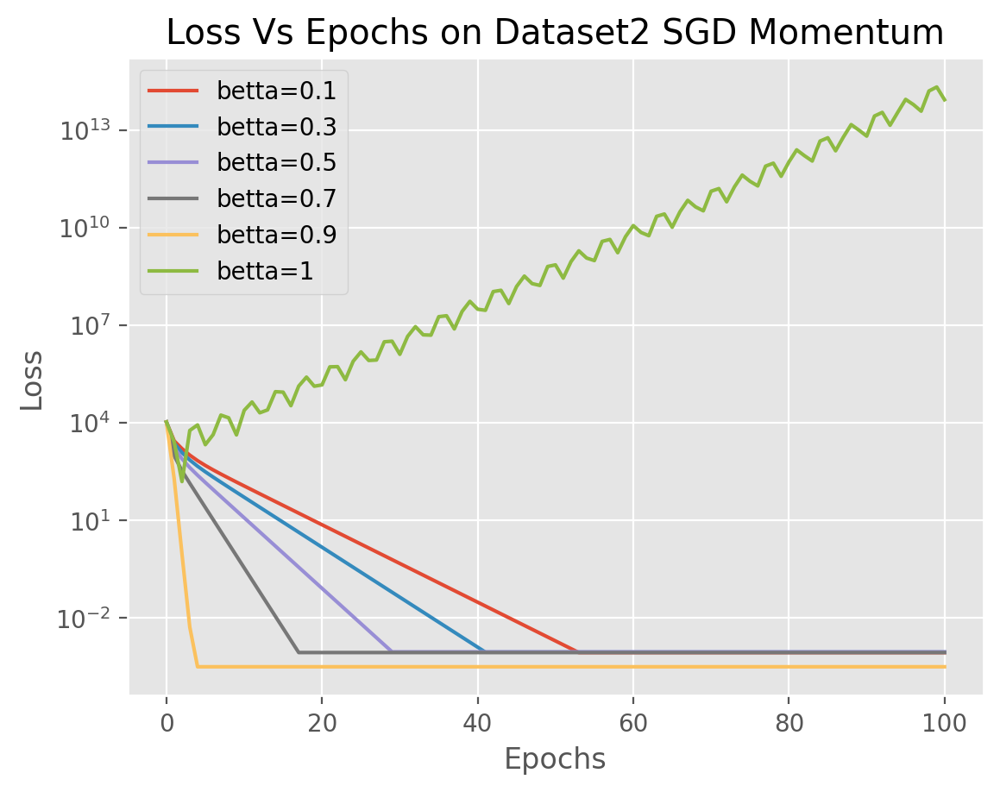

In [47]:
for i in range(len(bettas)):
    plt.plot(loss_SGDM2_lst[i],label=f"betta={bettas[i]}")
plt.legend()
plt.title("Loss Vs Epochs on Dataset2 SGD Momentum")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.yscale("log")
plt.show()

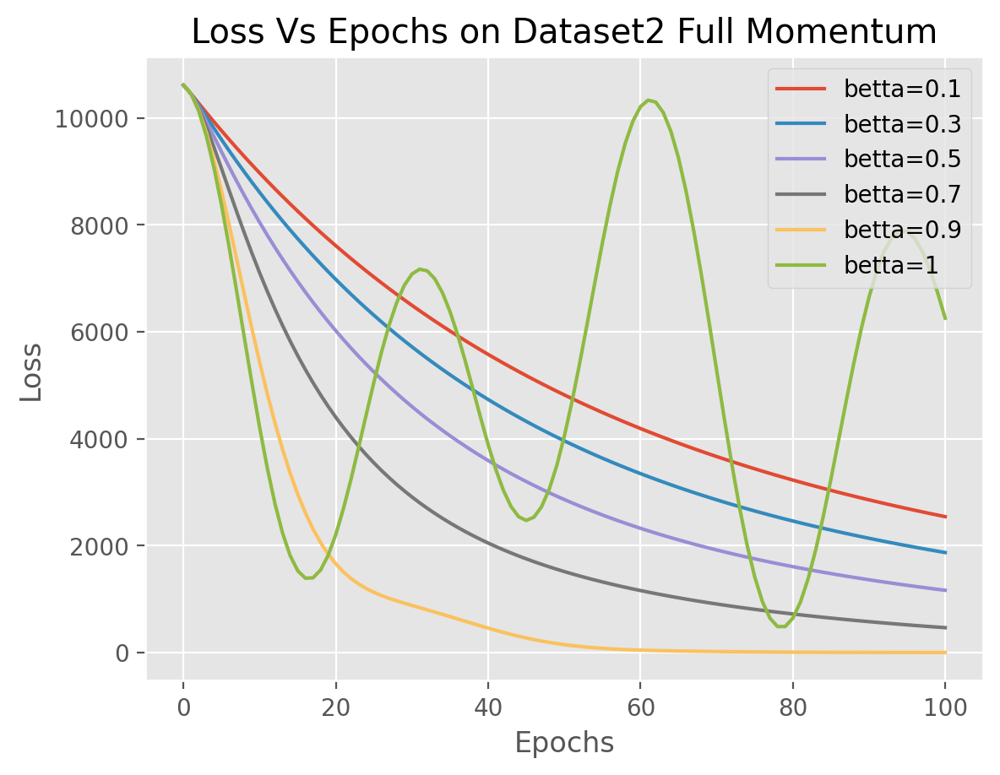

In [48]:
for i in range(len(bettas)):
    plt.plot(loss_FullGDM2_lst[i],label=f"betta={bettas[i]}")
plt.legend()
plt.title("Loss Vs Epochs on Dataset2 Full Momentum")
plt.xlabel("Epochs")
plt.ylabel("Loss")
# plt.yscale("log")
plt.show()